<a href="https://colab.research.google.com/github/simpler-env/SimplerEnv/blob/main/example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SimplerEnv: Simulated Manipulation Policy Evaluation for Real-World Robots

- Project page: <https://simpler-env.github.io/>
- Code: <https://github.com/simpler-env/SimplerEnv>

## Installation


In [10]:
#@title [!Important]Please use a GPU runtime.
!nvidia-smi


Thu Apr 24 15:07:11 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.133.07             Driver Version: 570.133.07     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 5080        Off |   00000000:01:00.0  On |                  N/A |
|  0%   49C    P5             19W /  360W |     394MiB /  16303MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# @title Install vulkan for rendering
!echo "R13944040" | sudo -S apt-get install -yqq --no-install-recommends libvulkan-dev vulkan-tools

# below fixes some bugs introduced by some recent Colab changes
!echo "R13944040" | sudo mkdir -p /usr/share/vulkan/icd.d
!wget -q -P /usr/share/vulkan/icd.d https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/nvidia_icd.json
!wget -q -O /usr/share/glvnd/egl_vendor.d/10_nvidia.json https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/10_nvidia.json

[sudo] jerry-tseng 的密碼： [sudo] jerry-tseng 的密碼： 
sudo: 需要密碼
^C
/usr/share/glvnd/egl_vendor.d/10_nvidia.json: 拒絕不符權限的操作


In [ ]:
# @title Make sure vulkan is installed correctly
!vulkaninfo | head -n 5

'DISPLAY' environment variable not set... skipping surface info
VULKANINFO

Vulkan Instance Version: 1.3.275


In [ ]:
# @title Install Real2Sim
!pip install numpy==1.24.4
!pip install orbax-checkpoint==0.4.4
!pip install scipy==1.12.0
!pip install keras==2.15.0
!pip install tensorflow==2.15.1
!git clone https://github.com/simpler-env/ManiSkill2_real2sim.git
!pip install -e ./ManiSkill2_real2sim
!git clone https://github.com/simpler-env/SimplerEnv.git
!pip install -e ./SimplerEnv
!mkdir ./SimplerEnv/checkpoints

  Using cached numpy-1.24.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.3
    Uninstalling numpy-2.2.3:
      Successfully uninstalled numpy-2.2.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.15.0 requires ml-dtypes~=0.2.0, but you have ml-dtypes 0.5.1 which is incompatible.
tf-agents 0.19.0 requires typing-extensions==4.5.0, but you have typing-extensions 4.12.2 which is incompatible.
  Using cached etils-1.12.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached msgpack-1.1.0-cp310-cp31

In [ ]:
#@title [Optional]Install RT-1 dependencies
! pip install --quiet tf_agents

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 8.33.0 requires typing_extensions>=4.6; python_version < "3.12", but you have typing-extensions 4.5.0 which is incompatible.


In [ ]:
#@title [Optional]Install Octo dependencies
!git clone https://github.com/octo-models/octo
!cd ./octo && git checkout 653c54acde686fde619855f2eac0dd6edad7116b && cd ..
!pip install -e ./octo
!pip install --upgrade "jax[cuda12_pip]==0.4.20" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html --no-deps
!pip install --upgrade "jaxlib[cuda12_pip]==0.4.20" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html --no-deps
!pip install jaxlib==0.4.20+cuda12.cudnn89
!pip install distrax==0.1.5 "einops>= 0.6.1"

fatal: 目的地路徑 'octo' 已經存在，並且不是一個空目錄。
HEAD 目前位於 653c54a Merge pull request #31 from octo-models/fix_robot_eval
Obtaining file:///home/jerry-tseng/robinlab/delta/VisionProject/code/SimplerEnv/octo
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for octo (pyproject.toml) ... done
  Created wheel for octo: filename=octo-0.0.0-0.editable-py3-none-any.whl size=3423 sha256=2b64161a7718f9dd7fb65a58d2f899d77fe07409cf74a709e8a343c5274c6562
  Stored in directory: /tmp/pip-ephem-wheel-cache-89thrltu/wheels/65/14/ff/f5472207762772e88d08e51ce8fd87ab25656db087ab668e4f
Successfully built octo
  Attempting uninstall: octo
    Found existing installation: octo 0.0.0
    Uninstalling octo-0.0.0:
      Successfully uninstalled octo-0.0.0
Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
  Using 

In [3]:
# @title Install other requirements
!pip install --quiet mediapy

In [3]:
# @title [Important]Post Installation

# run this so local pip installs are recognized
import site
site.main()

## Create a Simulated Environment and Take Random Actions

In [11]:
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict, get_image_from_maniskill2_obs_pointcloud, get_trajectory_image_from_maniskill2_all_obs_ver_pointcloud
import mediapy
import sapien as sp
import sapien.core as sapien


task_name = "google_robot_move_near"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]

if 'env' in locals():
  print("Closing existing env")
  env.close()
  del env
env = simpler_env.make(task_name)
# Colab GPU does not supoort denoiser
sapien.render_config.rt_use_denoiser = True
obs, reset_info = env.reset()
instruction = env.get_language_instruction()
print("Reset info", reset_info)
print("Instruction", instruction)

frames = []
done, truncated = False, False
while not (done or truncated):
   # action[:3]: delta xyz; action[3:6]: delta rotation in axis-angle representation;
   # action[6:7]: gripper (the meaning of open / close depends on robot URDF)
   image = get_image_from_maniskill2_obs_dict(env, obs)
   action = env.action_space.sample() # replace this with your policy inference
   obs, reward, done, truncated, info = env.step(action)
   #frames.append(image)

episode_stats = info.get('episode_stats', {})
print("Episode stats", episode_stats)
#mediapy.show_video(frames, fps=10)

Closing existing env


[2025-04-24 15:07:20.044] [svulkan2] [error] GLFW error: X11: The DISPLAY environment variable is missing
[2025-04-24 15:07:20.044] [svulkan2] [warning] Continue without GLFW.
/home/jerry-tseng/miniconda3/envs/simpler_env1/lib/python3.11/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_language_instruction to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_language_instruction` for environment variables or `env.get_wrapper_attr('get_language_instruction')` that will search the reminding wrappers.
  logger.warn(
/home/jerry-tseng/miniconda3/envs/simpler_env1/lib/python3.11/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.robot_uid to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.robot_uid` for environment variables or `env.get_wrapper_attr('robot_uid')` that will search the reminding wrappers.
  logger.war

Reset info {'scene_name': 'google_pick_coke_can_1_v4', 'scene_offset': None, 'scene_pose': None, 'scene_table_height': 0.87, 'urdf_version': 'recolor_tabletop_visual_matching_1', 'rgb_overlay_path': '/home/jerry-tseng/robinlab/delta/VisionProject/code_for_github/SimplerEnv/ManiSkill2_real2sim/data/real_inpainting/google_move_near_real_eval_1.png', 'rgb_overlay_cameras': ['overhead_camera'], 'rgb_overlay_mode': 'background', 'disable_bad_material': False, 'episode_model_ids': ('baked_opened_coke_can_v2', 'baked_opened_redbull_can_v2', 'baked_apple_v2'), 'episode_model_scales': [1.0, 1.0, 1.0], 'episode_source_obj_name': 'baked_opened_redbull_can_v2', 'episode_target_obj_name': 'baked_apple_v2', 'episode_source_obj_init_pose_wrt_robot_base': Pose([0.675581, 0.0807987, 0.873547], [0.0324824, 0.031188, -0.705082, -0.707695]), 'episode_target_obj_init_pose_wrt_robot_base': Pose([0.489771, -0.0872638, 0.844358], [0.0441865, 0.00114143, 0.0133371, -0.998934]), 'episode_id': 33}
Instruction mo

## Run Inference on Simulated Environments

In [12]:
# @title Setup
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict, get_image_from_maniskill2_obs_pointcloud, get_trajectory_image_from_maniskill2_all_obs_ver_pointcloud
import mediapy
import sapien as sp
import sapien.core as sapien
import os
import numpy as np
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
import mediapy


RT_1_CHECKPOINTS = {
    "rt_1_x": "rt_1_x_tf_trained_for_002272480_step",
    "rt_1_400k": "rt_1_tf_trained_for_000400120",
    "rt_1_58k": "rt_1_tf_trained_for_000058240",
    "rt_1_1k": "rt_1_tf_trained_for_000001120",
}


def get_rt_1_checkpoint(name, ckpt_dir="./checkpoints"):
  assert name in RT_1_CHECKPOINTS, name
  ckpt_name = RT_1_CHECKPOINTS[name]
  ckpt_path = os.path.join(ckpt_dir, ckpt_name)
  if not os.path.exists(ckpt_path):
    if name == "rt_1_x":
      !gsutil -m cp -r gs://gdm-robotics-open-x-embodiment/open_x_embodiment_and_rt_x_oss/{ckpt_name}.zip {ckpt_dir}
      !unzip {ckpt_dir}/{ckpt_name}.zip -d {ckpt_dir}
    else:
      !gsutil -m cp -r gs://gdm-robotics-open-x-embodiment/open_x_embodiment_and_rt_x_oss/{ckpt_name} {ckpt_dir}
  return ckpt_path

In [13]:
# @title Select your model and environment

task_name = "google_robot_move_near"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]

if 'env' in locals():
  print("Closing existing env")
  env.close()
  del env
env = simpler_env.make(task_name)

# Note: we turned off the denoiser as the colab kernel will crash if it's turned on
# To use the denoiser, please git clone our SIMPLER environments
# and perform evaluations locally.
sapien.render_config.rt_use_denoiser = False

obs, reset_info = env.reset()
instruction = env.get_language_instruction()
print("Reset info", reset_info)
print("Instruction", instruction)

if "google" in task_name:
  policy_setup = "google_robot"
else:
  policy_setup = "widowx_bridge"



Closing existing env


[2025-04-24 15:07:46.763] [svulkan2] [error] GLFW error: X11: The DISPLAY environment variable is missing
[2025-04-24 15:07:46.763] [svulkan2] [warning] Continue without GLFW.


Reset info {'scene_name': 'google_pick_coke_can_1_v4', 'scene_offset': None, 'scene_pose': None, 'scene_table_height': 0.87, 'urdf_version': 'recolor_tabletop_visual_matching_1', 'rgb_overlay_path': '/home/jerry-tseng/robinlab/delta/VisionProject/code_for_github/SimplerEnv/ManiSkill2_real2sim/data/real_inpainting/google_move_near_real_eval_1.png', 'rgb_overlay_cameras': ['overhead_camera'], 'rgb_overlay_mode': 'background', 'disable_bad_material': False, 'episode_model_ids': ('baked_opened_coke_can_v2', 'baked_opened_redbull_can_v2', 'baked_apple_v2'), 'episode_model_scales': [1.0, 1.0, 1.0], 'episode_source_obj_name': 'baked_opened_redbull_can_v2', 'episode_target_obj_name': 'baked_apple_v2', 'episode_source_obj_init_pose_wrt_robot_base': Pose([0.675581, 0.0807987, 0.873547], [0.0324824, 0.031188, -0.705082, -0.707695]), 'episode_target_obj_init_pose_wrt_robot_base': Pose([0.489771, -0.0872638, 0.844358], [0.0441865, 0.00114143, 0.0133371, -0.998934]), 'episode_id': 33}
Instruction mo

In [14]:
# @title Select your model and environment
model_name = "rt_1_x" # @param ["rt_1_x", "rt_1_400k", "rt_1_58k", "rt_1_1k", "octo-base", "octo-small"]

if "rt_1" in model_name:
  from simpler_env.policies.rt1.rt1_model import RT1Inference

  ckpt_path = get_rt_1_checkpoint(model_name)
  model = RT1Inference(saved_model_path=ckpt_path, policy_setup=policy_setup)
elif "octo" in model_name:
  from simpler_env.policies.octo.octo_model import OctoInference

  model = OctoInference(model_type=model_name, policy_setup=policy_setup, init_rng=0)
else:
  raise ValueError(model_name)


2025-04-24 15:07:49.625352: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-04-24 15:07:49.626405: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-04-24 15:07:49.627307: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# 從這裡開始

In [17]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict, get_image_from_maniskill2_obs_pointcloud
from ManiSkill2_real2sim.mani_skill2_real2sim.utils.sapien_utils import get_actor_state, get_articulation_padded_state  # 從正確的模組導入
from ManiSkill2_real2sim.mani_skill2_real2sim.utils.trimesh_utils import get_actor_meshes, get_articulation_meshes
import imageio
import random
import sapien.core as sapien

# 設定 Task Name
task_name = "google_robot_move_near"  # 設定您的任務名稱

obs, reset_info = env.reset()
instruction = env.get_language_instruction()
model.reset(instruction)
print(instruction)

sapien.render_config.rt_use_denoiser = True

images = []
actor_mesh_trajectory = {}  # 存儲第一個actor的運動軌跡
object_colors = {}  # 存儲每個物件的顏色
predicted_terminated, success, truncated = False, False, False
timestep = 0
max_timesteps = 500  # 設定模擬步數

actors = env.get_actors()
actor_mesh_trajectories = {}
actor_trajectories = {}
object_trajectories = {}
articulations = env.get_articulations()
articulation_trajectories = {}
articulation_pose_trajectories = {}
image_frames = []
articulation_trajectories = {}
articulation_pose_trajectories = {}
pointclouds_trajectoriy = {}
obs_records = []




move redbull can near coke can


# from pointcloud

In [18]:
import numpy as np
import imageio.v2 as imageio
import mediapy as media
import copy

max_dof = 16
timestep = 0
max_timesteps = 100
pointclouds_trajectory = {}
pointclouds_rgb = {}
current_frame_link_positions = {}

fix_obs = copy.deepcopy(obs)
# fix_obs['pointcloud']['xyzw'] = np.dot(fix_obs['pointcloud']['xyzw'][...,:3], overhead_camera_extrinsic[:3, :3])
# camera_coor_xyz = fix_obs['pointcloud']['xyzw'] + overhead_camera_extrinsic[:3, 3]
# fix_obs['pointcloud']['xyzw'] = camera_coor_xyz
obs_records.append(fix_obs)

image = get_image_from_maniskill2_obs_dict(env, obs)
image_frames.append(image)
images.append(image)

while not (predicted_terminated or truncated) and timestep < max_timesteps - 1:
    raw_action, action = model.step(get_image_from_maniskill2_obs_dict(env, obs).astype(np.uint8))
    predicted_terminated = bool(action["terminate_episode"][0] > 0)
    
    obs, reward, success, truncated, info = env.step(
        np.concatenate([action["world_vector"], action["rot_axangle"], action["gripper"]])
    )
    
    timestep += 1
    fix_obs = copy.deepcopy(obs)
    # camera_points = np.dot(overhead_camera_extrinsic, fix_obs['pointcloud']['xyzw'].T).T
    # fix_obs['pointcloud']['xyzw'] = camera_points
    obs_records.append(fix_obs)
    

    for actor in actors:
        # 假設您只想記錄特定名稱的 actor，這裡可以修改條件來處理不同名稱的 acto
        
        actor_state = get_actor_state(actor)
        position = actor_state[:7]  # 獲取 3D 座標（x, y, z）
        # 如果 actor 不在字典中，則初始化
        if actor.get_name() not in actor_trajectories:
            actor_trajectories[actor.get_name()] = []  
        
        # 記錄該 actor 的位置
        actor_trajectories[actor.get_name()].append(position)
    
    # 遍歷所有 articulation 並使用 get_articulation_padded_state 填充狀態
    for articulation in articulations:
    # 使用 get_articulation_padded_state 而不是 get_articulation_state
        padded_state = get_articulation_padded_state(articulation, max_dof)
        
        # Initialize if needed
        if articulation not in articulation_trajectories:
            articulation_trajectories[articulation] = []
            articulation_pose_trajectories[articulation] = []
        
        # Add padded state to trajectories
        articulation_trajectories[articulation].append(padded_state)
        
        # Initialize a list to store all link positions for this frame

        
        # 遍歷 articulation 的每個 link 並儲存其位置
        for link in articulation.get_links():
            link_pose = link.get_pose()
            if link not in current_frame_link_positions:
                current_frame_link_positions[link] = []
                
            current_frame_link_positions[link].append(link_pose)
        
        # Store all link positions for this frame
        articulation_pose_trajectories[articulation].append(current_frame_link_positions)





    image = get_image_from_maniskill2_obs_dict(env, obs)
    image_frames.append(image)
    images.append(image)
    

# 儲存為 GIF
gif_path = f"{task_name}_mesh_trajectories.gif"

#imageio.mimsave(gif_path, images.astype(np.uint8), fps=20)
media.show_video(images, fps=10)
print(f"GIF 已儲存：{gif_path}")

GIF 已儲存：google_robot_move_near_mesh_trajectories.gif


In [ ]:
def get_default_obs_camera_name(env):
    # TODO: should not assume env.unwrapped.robot_uid
    # obtain image from observation dictionary returned by ManiSkill2 environment
    if "google_robot" in env.unwrapped.robot_uid:
        camera_name = "overhead_camera"
    elif "widowx" in env.unwrapped.robot_uid:
        camera_name = "3rd_view_camera"
    else:
        raise NotImplementedError()
    
    return camera_name

def world_to_screen(env, obs_camera_name, positions):
    """Convert 3D positions in world frame to 2D positions in screen frame.

    Args:
        env: Gym environment object.
        obs_camera_name: A string indicates the camera name
        positions: A np array of shape [N, 3/4], indicating 3D positions in
            world frame, where sapien uses OpenGL world frame.
    """    
    if positions.shape[-1] == 3:
        positions = np.concatenate(
            [positions, np.ones_like(positions[..., :1])], axis=-1
        )
    camera_params = env.unwrapped._cameras[obs_camera_name].get_params()
    cam2world = camera_params["cam2world_gl"]

    camera_3d = positions @ (np.linalg.inv(cam2world)).T
    camera_3d = camera_3d[..., :3] / camera_3d[..., 3:4]
    pixel_2d = camera_to_screen(
        env, obs_camera_name, camera_3d.reshape(-1, 3))
    
    return pixel_2d


def camera_to_screen(env, obs_camera_name, positions):
    """Convert 3D positions in camera frame to 2D positions in screen frame.

    Args:
        env: Gym environment object.
        obs_camera_name: A string indicates the camera name
        positions: A np array of shape [N, 3], indicating 3D positions in
            camera frame, where sapien uses OpenGL camera frame.
    """
    camera = env.unwrapped._cameras[obs_camera_name].camera

    # Sapien use OpenGL projection matrix
    cx, cy = camera.cx, camera.cy
    w, h = camera.width, camera.height
    near, far = camera.near, camera.far
    fx, fy = camera.fx, camera.fy
    opengl_mtx = np.array([
        [2 * fx / w, 0.0, (w - 2 * cx) / w, 0.0],
        [0.0, -2 * fy / h, (h - 2 * cy) / h, 0.0],
        [0.0, 0.0, (-far - near) / (far - near), -2.0 * far * near / (far - near)],
        [0.0, 0.0, -1.0, 0.0]
    ])

    # Convert 3D positions to 2D positions
    positions = np.concatenate(
        [positions, np.ones((positions.shape[0], 1))], axis=1)

    clip_points = positions @ opengl_mtx.T
    ndc_points = clip_points / clip_points[:, 3:4]

    viewport_points = (
        (ndc_points + 1.0) / 2.0 * np.array([w, h, 1.0, 1.0]).reshape(1, 4)
    )

    return viewport_points[:, :2]
    
def world_to_local(points_world, pose):
    p = pose[:3]
    q = pose[3:7]
    q = [q[1], q[2], q[3], q[0]]
    r = R.from_quat(q).as_matrix()
    return (r.T @ (points_world - p).T).T

def local_to_world(points_local, pose):
    p = pose[:3]
    q = pose[3:7]
    q = [q[1], q[2], q[3], q[0]]
    r = R.from_quat(q).as_matrix()
    return (r @ points_local.T).T + p

def visualize_actor_link_points_per_frame(images, env, actor_trajectories, actors_points,
                                          current_frame_link_positions, link_points,
                                          camera_name="overhead_camera", max_frames=None):
    from scipy.spatial.transform import Rotation as R
    import matplotlib.pyplot as plt
    import numpy as np
    frames = []
    num_frames = len(images) if max_frames is None else min(max_frames, len(images))

    actor_colors = ['red', 'blue', 'green', 'orange']
    link_colors = ['cyan', 'purple', 'magenta', 'yellow', 'lime']
    link_name_to_link = {link.get_name(): link for link in current_frame_link_positions}

    for i in range(num_frames):
        img = images[i+1]
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(img)

        # 移除標題、邊框、刻度、軸線
        ax.axis('off')  # 關閉座標軸
        ax.set_title("")  # 不要標題

        # 畫 actor 點
        for j, (actor_name, points_local) in enumerate(actors_points.items()):
            if len(points_local) == 0:
                continue
            pose = actor_trajectories[actor_name][i]
            p = pose[:3]
            q = pose[3:7]
            r = R.from_quat(q).as_matrix()

            pose0 = actor_trajectories[actor_name][0]
            p0 = pose[:3]
            q0 = pose[3:7]
            r0 = R.from_quat(q).as_matrix()
            points_local = np.array(points_local)
            points_world = world_to_local(points_local, pose0)
            points_local = local_to_world(points_world, pose)
            
            #points_world = (r @ points_local.T).T + p
            points_2d = world_to_screen(env, camera_name, points_local)

            H, W = images[i].shape[:2]
            x, y = points_2d[:, 0], points_2d[:, 1]
            mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
            ax.scatter(x[mask], y[mask], s=5, c=actor_colors[j % len(actor_colors)], label=f"[Actor] {actor_name}")

        # 畫 link 點
        for j, (link, points_local) in enumerate(link_points.items()):
            pose = current_frame_link_positions[link][i]
            pose0 = current_frame_link_positions[link][0]
            p, q = extract_pose_np(pose)
            pose_vec = np.concatenate([p, q])
            p0, q0 = extract_pose_np(pose0)
            pose0_vec = np.concatenate([p0, q0])
            points_local = np.array(points_local)
            points_world = world_to_local(points_local, pose0_vec)
            points_local = local_to_world(points_world, pose_vec)
            
            #print(f"link: {link_name}, projected {points_2d.shape[0]} points")
            
            points_2d = world_to_screen(env, camera_name, points_local)

            x, y = points_2d[:, 0], points_2d[:, 1]
            mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
            ax.scatter(x[mask], y[mask], s=5, c=link_colors[j % len(link_colors)], label=f"[Link] {link.get_name()}")

        plt.tight_layout(pad=0)
        plt.show()
        fig.canvas.draw()
        frame = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        frame = frame.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        frames.append(frame)
        plt.close(fig)
        
    imageio.mimsave("actor_link_dot.gif", frames, fps=5, loop=0)



In [30]:
import numpy as np
import trimesh
from scipy.spatial.transform import Rotation as R
from sklearn.utils import resample


base_info = obs_records[4]
#print(actors)
array_data = np.array(actor_trajectories['arena'])
print(array_data[4])

actors_meshes = {}
for actor in actors:
    actor_meshes = get_actor_meshes(actor)
    
    if actor.get_name() not in actor_meshes:
        actors_meshes[actor.get_name()] = [] 
    
    actors_meshes[actor.get_name()] = actor_meshes

print(actors_meshes['arena']) 


pose = array_data[4]
p = pose[:3]  
q = pose[3:7]  
q = [q[1], q[2], q[3], q[0]]
print(p)

r = R.from_quat(q).as_matrix()  

mesh = actors_meshes['arena'][0]  


rotated_vertices = (r @ mesh.vertices.T).T  
translated_vertices = rotated_vertices + p 


world_mesh = trimesh.Trimesh(vertices=translated_vertices, faces=mesh.faces)


world_mesh.show()




init_points = base_info['image']['overhead_camera']['xyzw'].reshape(-1,4)
init_points = resample(init_points, n_samples=10000, random_state=42)
init_points = init_points[ :, :3]

closest_points, distances, _ = world_mesh.nearest.on_surface(init_points)







[ 1.66159999  3.03369999 -0.          1.          0.          0.
  0.        ]
[<trimesh.Trimesh(vertices.shape=(21585, 3), faces.shape=(38097, 3))>]
[ 1.66159999  3.03369999 -0.        ]


(7713, 3)
(2287, 3)
(7713, 3)
[[358.49963478 190.49950799]
 [307.49992977 229.49966713]
 [ 92.49943707 206.4986531 ]
 ...
 [129.50031623 407.49910601]
 [343.49962482 190.49950305]
 [414.49989901 383.50051298]]


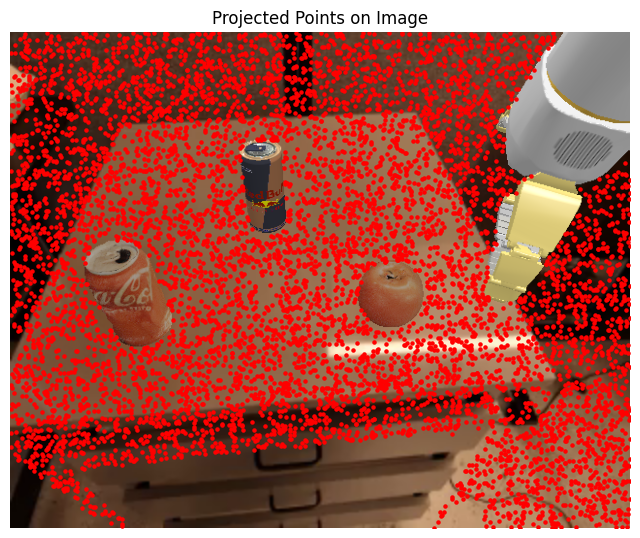

In [31]:
threshold = 0.0007 
near_mask = distances < threshold

inside_points = init_points[near_mask]
outside_points = init_points[~near_mask]
print(inside_points.shape)
print(outside_points.shape)

print(inside_points.shape)
proj_inside_points = world_to_screen(env, 'overhead_camera', inside_points)
print(proj_inside_points)
import matplotlib.pyplot as plt

# 將 x, y 分開
x = proj_inside_points[:, 0]
y = proj_inside_points[:, 1]

plt.figure(figsize=(8, 8))
plt.imshow(images[4])  # 顯示底圖
plt.scatter(x, y, s=5, c='red')  # 在圖上畫點
plt.axis('off')
plt.title("Projected Points on Image")
plt.show()


In [61]:
import numpy as np
import trimesh
from scipy.spatial.transform import Rotation as R


base_info = obs_records[0]
#print(actors)
array_data = np.array(actor_trajectories['arena'])
print(array_data[4])

actors_meshes = {}
for actor in actors:
    actor_meshes = get_actor_meshes(actor)
    
    if actor.get_name() not in actor_meshes:
        actors_meshes[actor.get_name()] = [] 
    
    actors_meshes[actor.get_name()] = actor_meshes

print(actors_meshes['arena']) 


# Arena pose
pose = array_data[0]
p = pose[:3]  # position
q = pose[3:7]  # quaternion (x, y, z, w)
q = [q[1], q[2], q[3], q[0]]  # Re-order quaternion
print(p)

r = R.from_quat(q).as_matrix()  # 3x3 rotation matrix

# Get mesh for arena
mesh = actors_meshes['arena'][0]  

# Apply rotation and translation
rotated_vertices = (r @ mesh.vertices.T).T  # Apply rotation
translated_vertices = rotated_vertices + p  # Apply translation

# Create a world mesh
world_mesh = trimesh.Trimesh(vertices=translated_vertices, faces=mesh.faces)
world_mesh.show()

# Get the initial points of the arena


# Find the closest points on the surface of the arena mesh
closest_points, distances, _ = world_mesh.nearest.on_surface(init_points)

# Define threshold for point selection (5mm)
threshold = 0.01  # 5mm error range (you can adjust)
near_mask = distances < threshold

# Get inside and outside points based on the threshold
inside_points = init_points[near_mask]
outside_points = init_points[~near_mask]

# Create a set for quick look-up of already selected points from arena
inside_points_set = set(map(tuple, inside_points))  # Convert to tuples for set comparison



[ 1.66159999  3.03369999 -0.          1.          0.          0.
  0.        ]
[<trimesh.Trimesh(vertices.shape=(21585, 3), faces.shape=(38097, 3))>]
[ 1.66159999  3.03369999 -0.        ]


In [ ]:
# Initialize a dictionary to store other actors' points
actors_points = {}
threshold = 0.15
# Iterate through each actor (excluding 'arena') and find their points
for actor_name, meshes in actors_meshes.items():
    if actor_name == 'arena':
        continue  # Skip arena

    actor_mesh = meshes[0]  # Assuming each actor has a mesh

    # Apply the same transformation for each actor
    pose = array_data = np.array(actor_trajectories[actor_name][4])  # Get the actor's pose
    p = pose[:3]
    q = pose[3:7]
    q = [q[1], q[2], q[3], q[0]]
    r = R.from_quat(q).as_matrix()

    rotated_vertices = (r @ actor_mesh.vertices.T).T
    translated_vertices = rotated_vertices + p

    actor_world_mesh = trimesh.Trimesh(vertices=translated_vertices, faces=actor_mesh.faces)

    # Find the closest points for the current actor
    closest_points, distances, _ = actor_world_mesh.nearest.on_surface(init_points)

    # Filter points that are within the threshold and not in arena points
    near_mask = distances < threshold
    actor_inside_points = init_points[near_mask]

    # Exclude points that are already in the arena (inside_points_set)
    unique_actor_points = [pt for pt in actor_inside_points if tuple(pt) not in inside_points_set]
    
    actors_points[actor_name] = unique_actor_points

    # Optionally, you can print the points for each actor
    print(f"Actor '{actor_name}' unique points: {len(unique_actor_points)}")
    #print(f"Points: {unique_actor_points}")

# Now, `actors_points` holds the unique points for each actor that are within the threshold

Actor 'baked_opened_coke_can_v2' unique points: 208
Actor 'baked_opened_redbull_can_v2' unique points: 133
Actor 'baked_apple_v2' unique points: 114


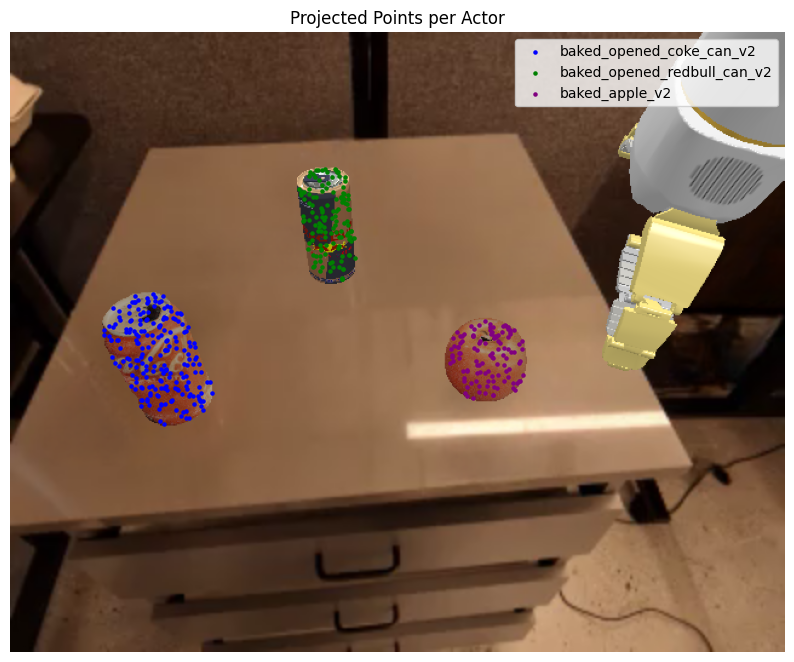

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 先畫 arena 的點（紅色）
proj_inside_points = world_to_screen(env, 'overhead_camera', inside_points)
x = proj_inside_points[:, 0]
y = proj_inside_points[:, 1]

plt.figure(figsize=(10, 10))
plt.imshow(images[4])
# plt.scatter(x, y, s=5, c='red', label='arena')

# 為其他 actors 使用不同顏色
colors = ['blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow']
color_map = {}

for i, (actor_name, points) in enumerate(actors_points.items()):
    if len(points) == 0:
        continue  # 如果該 actor 沒有點，跳過

    color = colors[i % len(colors)]  # 如果超過顏色數量，會循環使用
    color_map[actor_name] = color

    points = np.array(points)
    proj_points = world_to_screen(env, 'overhead_camera', points)
    x = proj_points[:, 0]
    y = proj_points[:, 1]

    # 可以加個 mask 確保點沒超出圖片大小
    H, W = images[0].shape[:2]
    mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
    x, y = x[mask], y[mask]

    plt.scatter(x, y, s=5, c=color, label=actor_name)

# 顯示圖例 & 結果
plt.legend()
plt.axis('off')
plt.title("Projected Points per Actor")
plt.show()


In [37]:

meshes = get_articulation_meshes(articulations[0])
links = articulations[0].get_links()

for link, mesh in zip(links, meshes):
    print(f"Link: {link.get_name()}, Mesh: {mesh}")



Link: link_base, Mesh: <trimesh.Trimesh(vertices.shape=(263, 3), faces.shape=(568, 3))>
Link: link_base_inertial, Mesh: <trimesh.Trimesh(vertices.shape=(181, 3), faces.shape=(326, 3))>
Link: link_wheel_left, Mesh: <trimesh.Trimesh(vertices.shape=(181, 3), faces.shape=(326, 3))>
Link: link_wheel_right, Mesh: <trimesh.Trimesh(vertices.shape=(40, 3), faces.shape=(76, 3))>
Link: link_rear_wheel_left, Mesh: <trimesh.Trimesh(vertices.shape=(40, 3), faces.shape=(76, 3))>
Link: link_rear_wheel_right, Mesh: <trimesh.Trimesh(vertices.shape=(121, 3), faces.shape=(234, 3))>
Link: link_torso, Mesh: <trimesh.Trimesh(vertices.shape=(125, 3), faces.shape=(242, 3))>
Link: link_shoulder, Mesh: <trimesh.Trimesh(vertices.shape=(122, 3), faces.shape=(236, 3))>
Link: link_bicep, Mesh: <trimesh.Trimesh(vertices.shape=(118, 3), faces.shape=(228, 3))>
Link: link_elbow, Mesh: <trimesh.Trimesh(vertices.shape=(166, 3), faces.shape=(320, 3))>
Link: link_forearm, Mesh: <trimesh.Trimesh(vertices.shape=(113, 3), face

In [ ]:
from scipy.spatial.transform import Rotation as R
import numpy as np
from ManiSkill2_real2sim.mani_skill2_real2sim.utils.trimesh_utils import get_actor_mesh

def extract_pose_np(pose):
    if isinstance(pose, np.ndarray):
        if pose.shape == (7,):
            # Standard flat array
            p = pose[:3]
            q = pose[3:7]
        elif pose.shape == (2,):  # Likely [position, quaternion]
            p = np.array(pose[0])
            q = np.array(pose[1])
        else:
            raise ValueError(f"Unsupported ndarray pose shape: {pose.shape}")
    elif isinstance(pose, (list, tuple)) and len(pose) == 2:
        # Like [position, quaternion]
        p = np.array(pose[0])
        q = np.array(pose[1])
    elif hasattr(pose, 'p') and hasattr(pose, 'q'):
        # sapien.core.Pose
        p = np.array([pose.p[0], pose.p[1], pose.p[2]])
        q = np.array([pose.q[1], pose.q[2], pose.q[3], pose.q[0]])
    else:
        raise TypeError(f"Unrecognized pose type: {type(pose)}")
    return p, q




link_points = {}  # 每個 link 對應一組點
threshold = 0.05  # 可調整的距離容忍值（例如 5mm）

meshes = get_articulation_meshes(articulations[0])
links = articulations[0].get_links()

for link in articulations[0].get_links():
    mesh = get_actor_mesh(link, False)
    if mesh is None:
        continue
    pose = current_frame_link_positions[link][4]
    p, q = extract_pose_np(pose)

    r = R.from_quat(q).as_matrix()
    world_vertices = (r @ mesh.vertices.T).T + p
    world_mesh = trimesh.Trimesh(vertices=world_vertices, faces=mesh.faces)
    closest_points, distances, _ = world_mesh.nearest.on_surface(init_points)

    # 篩選那些距離小於 threshold 的點（認為是在該 link 上）
    near_mask = distances < threshold
    near_points = init_points[near_mask]

    if len(near_points) == 0:
        continue
    # 存進 link_points 字典
    link_points[link] = near_points
    
    print(f"[{link.get_name()}] matched {len(near_points)} points")



[link_forearm] matched 202 points
[link_wrist] matched 496 points
[link_gripper] matched 507 points
[link_finger_right] matched 9 points
[link_finger_tip_right] matched 7 points
[link_finger_nail_right] matched 1 points
[link_finger_left] matched 367 points
[link_finger_tip_left] matched 199 points
[link_finger_nail_left] matched 32 points


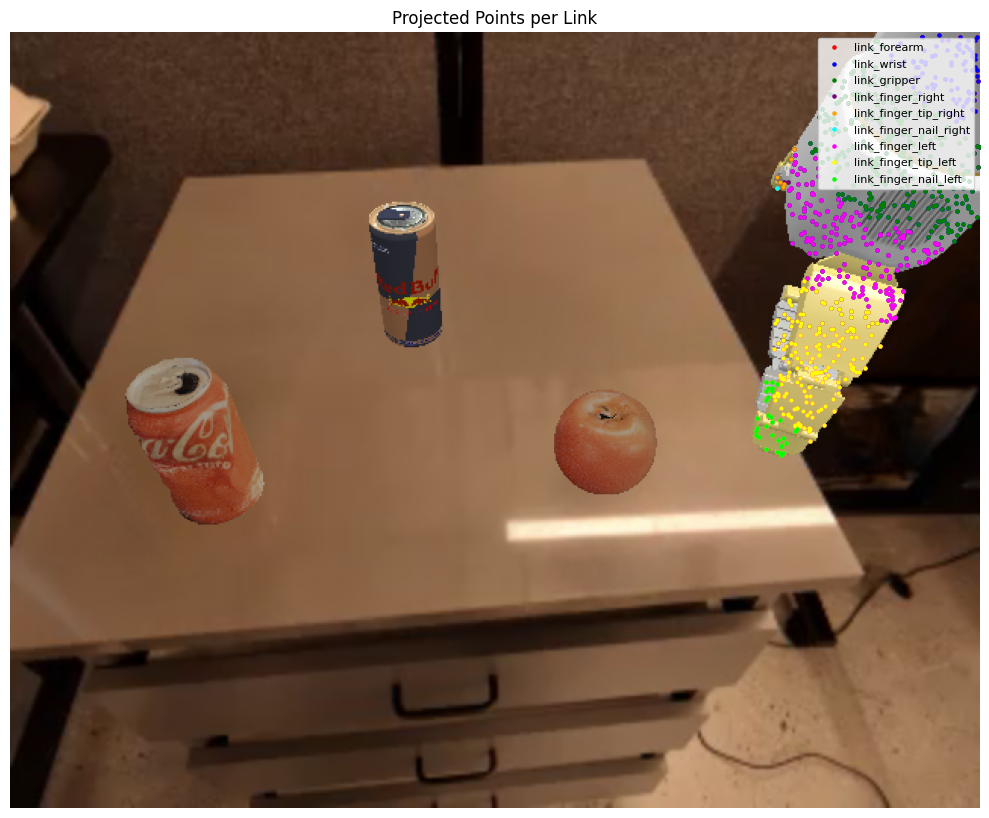

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 假設你有一張相機圖像
H, W = images[0].shape[:2]

plt.figure(figsize=(10, 10))
plt.imshow(images[4])

# 顏色清單可擴充
colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'lime']
color_map = {}

for i, (link_name, points) in enumerate(link_points.items()):
    if len(points) == 0:
        continue

    color = colors[i % len(colors)]
    color_map[link_name] = color

    points = np.array(points)
    proj_points = world_to_screen(env, 'overhead_camera', points)
    x = proj_points[:, 0]
    y = proj_points[:, 1]

    # 避免畫出超出圖片邊界的點
    mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
    x, y = x[mask], y[mask]

    plt.scatter(x, y, s=5, c=color, label=link_name.get_name())



# 顯示圖例與美化
plt.legend(loc='upper right', fontsize=8)
plt.axis('off')
plt.title("Projected Points per Link")
plt.tight_layout()
plt.show()


# try

In [59]:
def world_to_local(points_world, pose):
    p = pose[:3]
    q = pose[3:7]
    q = [q[1], q[2], q[3], q[0]]
    r = R.from_quat(q).as_matrix()
    return (r.T @ (points_world - p).T).T

def local_to_world(points_local, pose):
    p = pose[:3]
    q = pose[3:7]
    q = [q[1], q[2], q[3], q[0]]
    r = R.from_quat(q).as_matrix()
    return (r @ points_local.T).T + p

def visualize_actor_link_points_per_frame(images, env, actor_trajectories, actors_points,
                                          current_frame_link_positions, link_points,
                                          camera_name="overhead_camera", max_frames=None):
    from scipy.spatial.transform import Rotation as R
    import matplotlib.pyplot as plt
    import numpy as np
    frames = []
    num_frames = len(images) if max_frames is None else min(max_frames, len(images))

    actor_colors = ['red', 'blue', 'green', 'orange']
    link_colors = ['cyan', 'purple', 'magenta', 'yellow', 'lime']
    link_name_to_link = {link.get_name(): link for link in current_frame_link_positions}

    for i in range(num_frames):
        img = images[i+4]
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(img)

        # 移除標題、邊框、刻度、軸線
        ax.axis('off')  # 關閉座標軸
        ax.set_title("")  # 不要標題

        # 畫 actor 點
        for j, (actor_name, points_local) in enumerate(actors_points.items()):
            if len(points_local) == 0:
                continue
            pose = actor_trajectories[actor_name][i+4]
            p = pose[:3]
            q = pose[3:7]
            r = R.from_quat(q).as_matrix()

            pose0 = actor_trajectories[actor_name][4]
            p0 = pose[:3]
            q0 = pose[3:7]
            r0 = R.from_quat(q).as_matrix()
            points_local = np.array(points_local)
            points_world = world_to_local(points_local, pose0)
            points_local = local_to_world(points_world, pose)
            
            #points_world = (r @ points_local.T).T + p
            points_2d = world_to_screen(env, camera_name, points_local)

            H, W = images[i].shape[:2]
            x, y = points_2d[:, 0], points_2d[:, 1]
            mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
            ax.scatter(x[mask], y[mask], s=5, c=actor_colors[j % len(actor_colors)], label=f"[Actor] {actor_name}")

        # 畫 link 點
        for j, (link, points_local) in enumerate(link_points.items()):
            pose = current_frame_link_positions[link][i+4]
            pose0 = current_frame_link_positions[link][4]
            p, q = extract_pose_np(pose)
            pose_vec = np.concatenate([p, q])
            p0, q0 = extract_pose_np(pose0)
            pose0_vec = np.concatenate([p0, q0])
            points_local = np.array(points_local)
            points_world = world_to_local(points_local, pose0_vec)
            points_local = local_to_world(points_world, pose_vec)
            
            #print(f"link: {link_name}, projected {points_2d.shape[0]} points")
            
            points_2d = world_to_screen(env, camera_name, points_local)

            x, y = points_2d[:, 0], points_2d[:, 1]
            mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
            ax.scatter(x[mask], y[mask], s=5, c=link_colors[j % len(link_colors)], label=f"[Link] {link.get_name()}")

        plt.tight_layout(pad=0)
        plt.show()
        fig.canvas.draw()
        frame = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        frame = frame.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        frames.append(frame)
        plt.close(fig)
        
    imageio.mimsave("actor_link_dot.gif", frames, fps=5, loop=0)


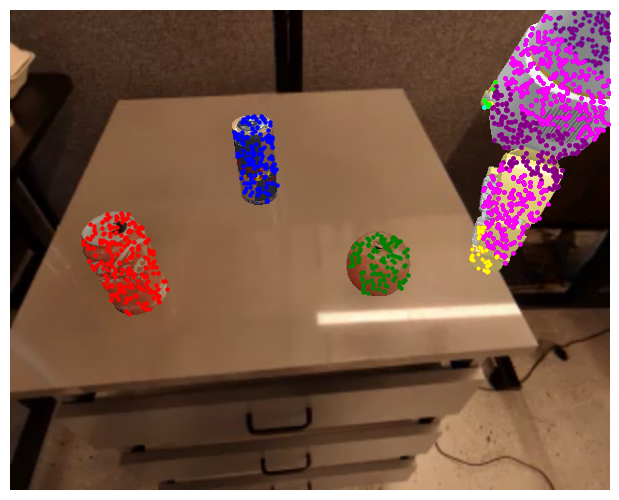

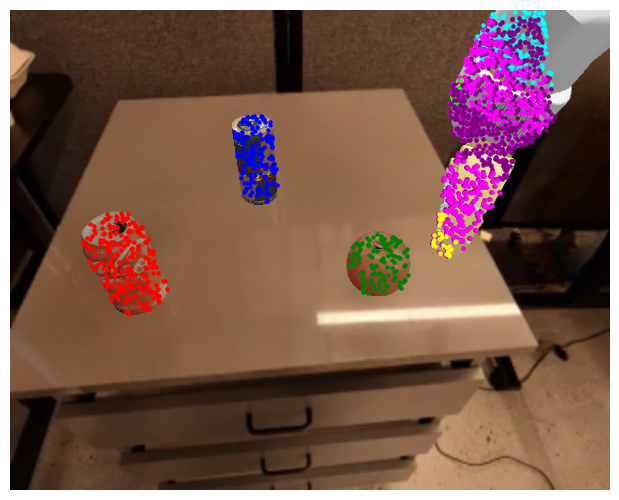

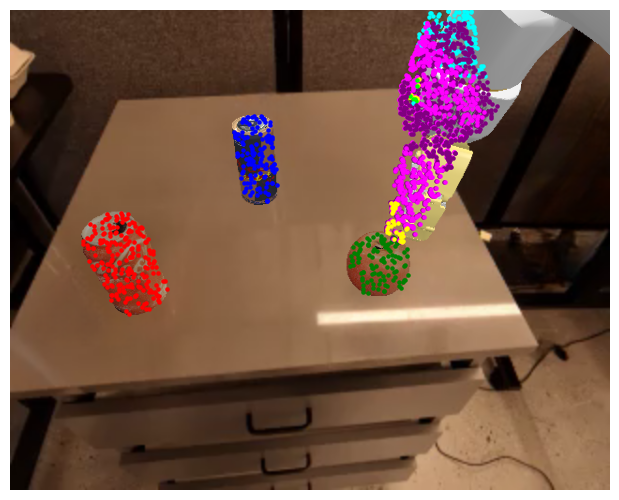

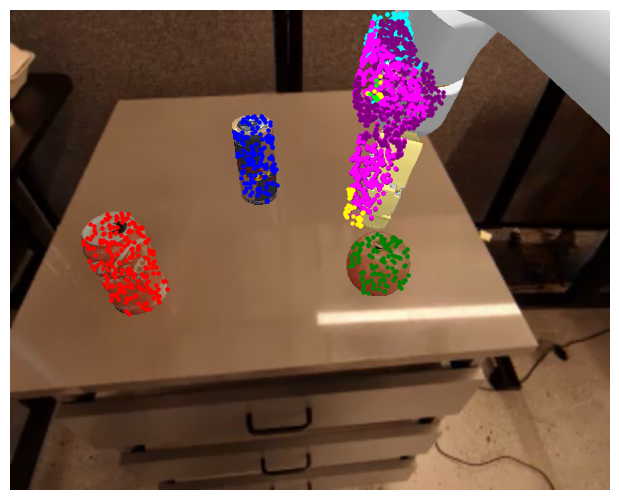

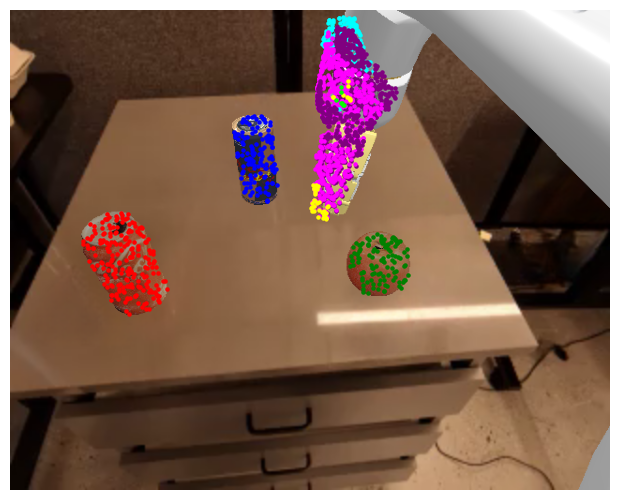

...

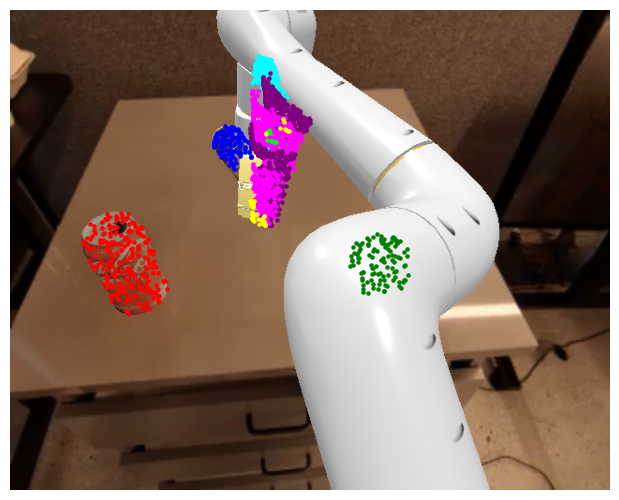

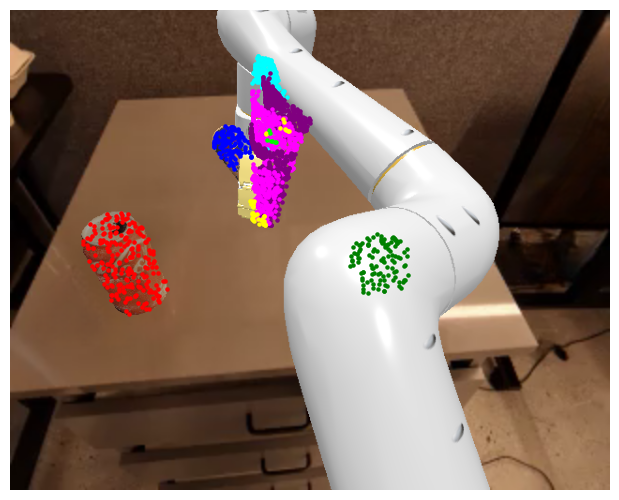

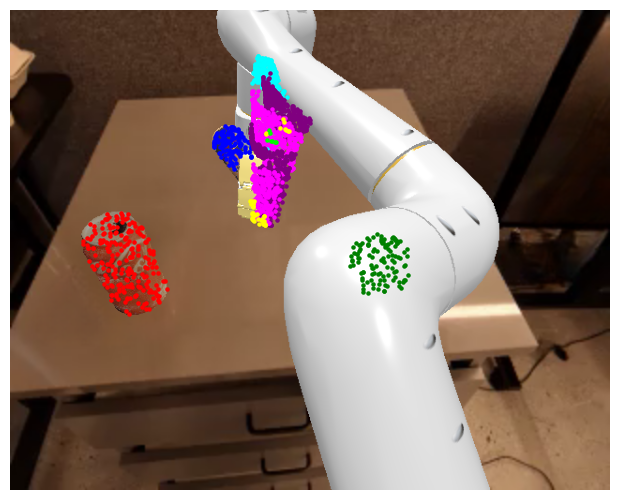

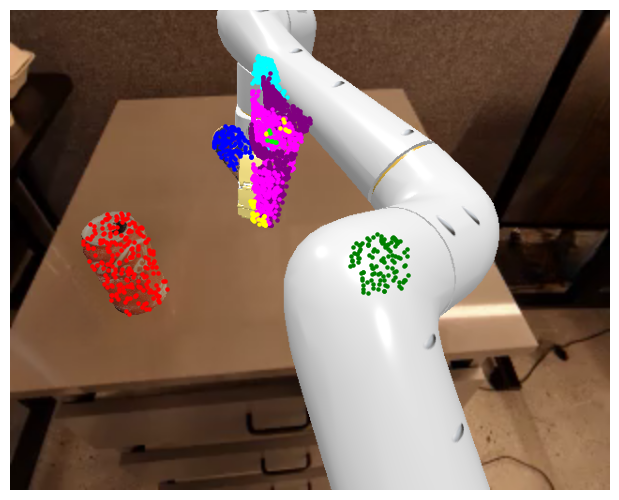

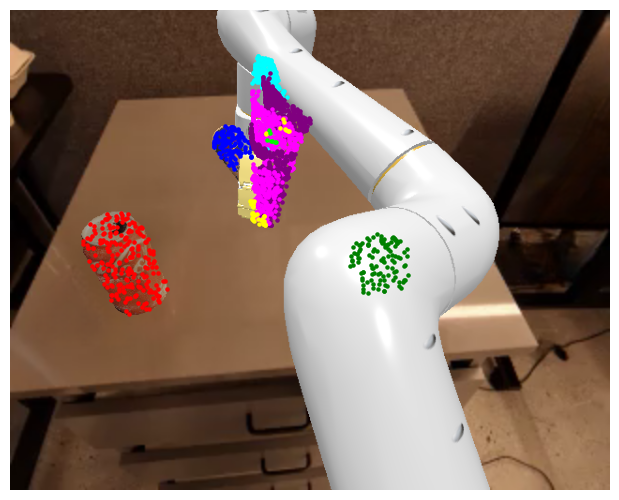

In [60]:
visualize_actor_link_points_per_frame(
    images=images,
    env=env,
    actor_trajectories=actor_trajectories,
    actors_points=actors_points,
    current_frame_link_positions=current_frame_link_positions,
    link_points=link_points,
    camera_name="overhead_camera",
    max_frames=20 # 可選，只顯示前幾 frame
)


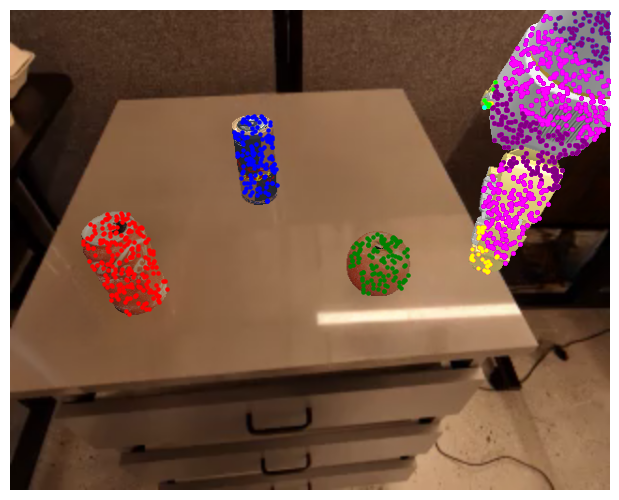

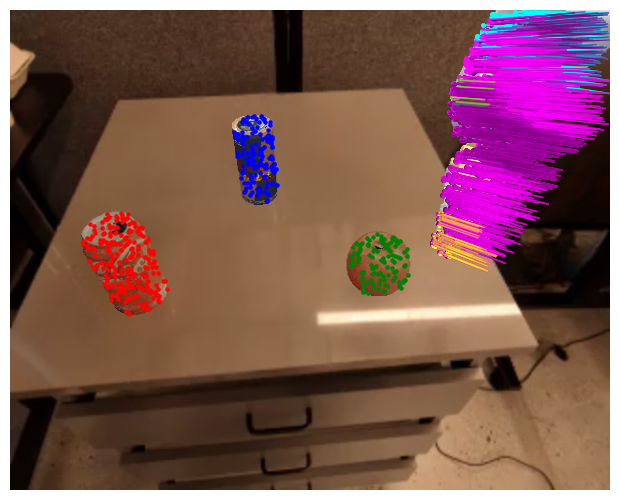

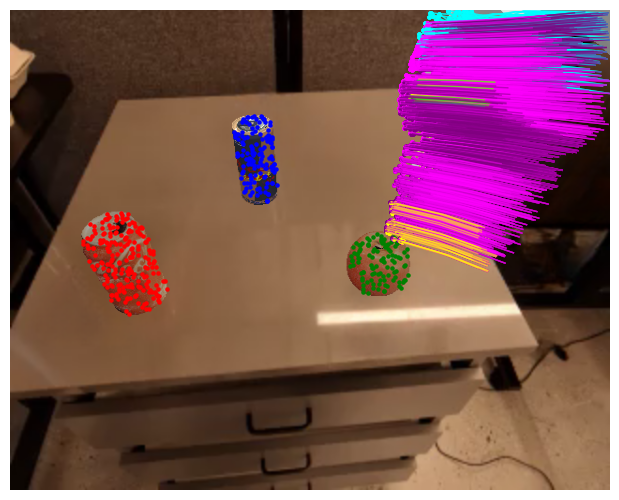

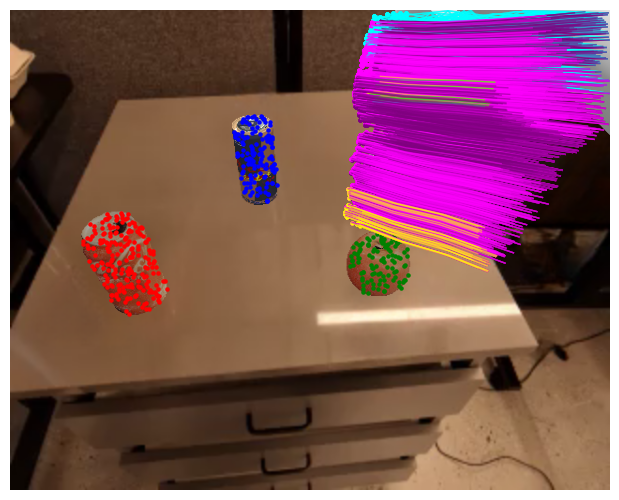

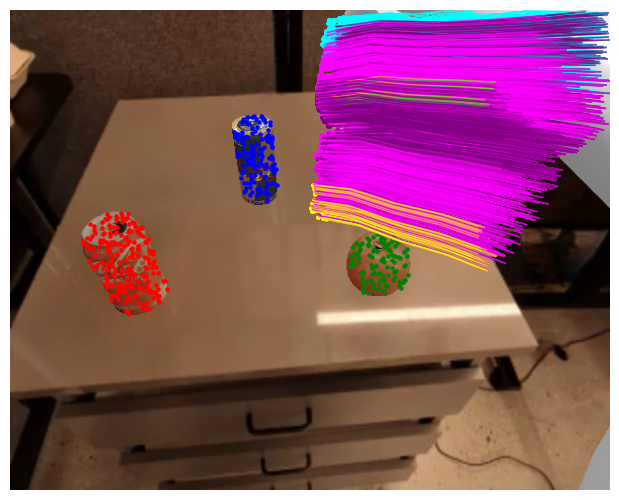

...

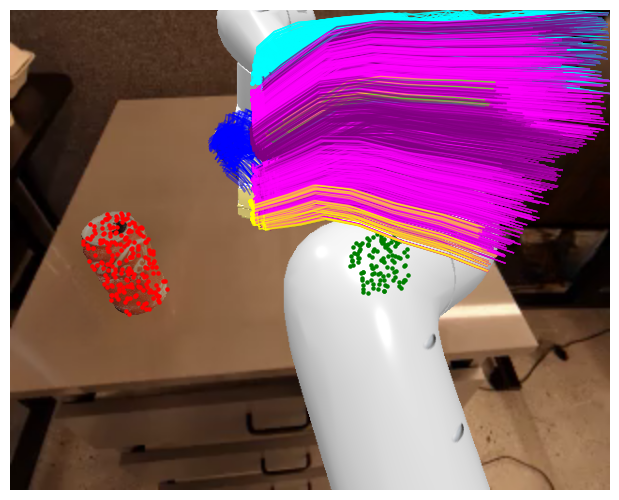

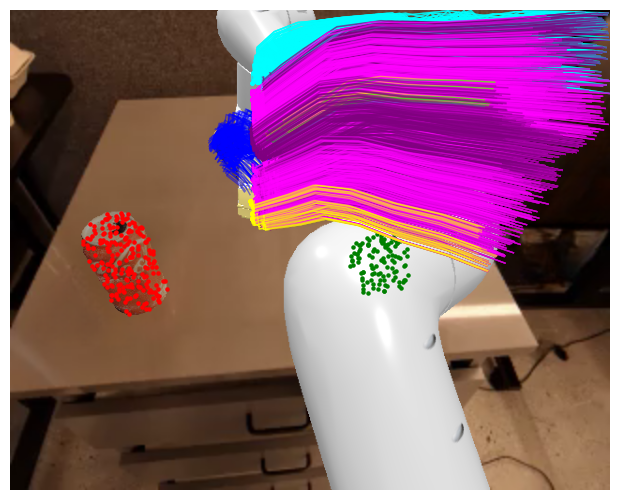

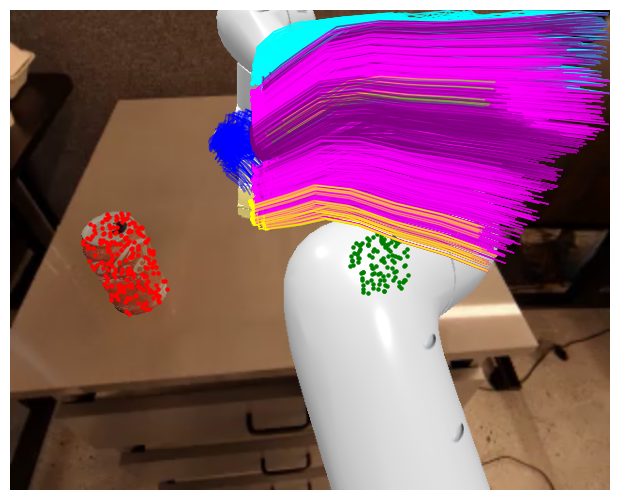

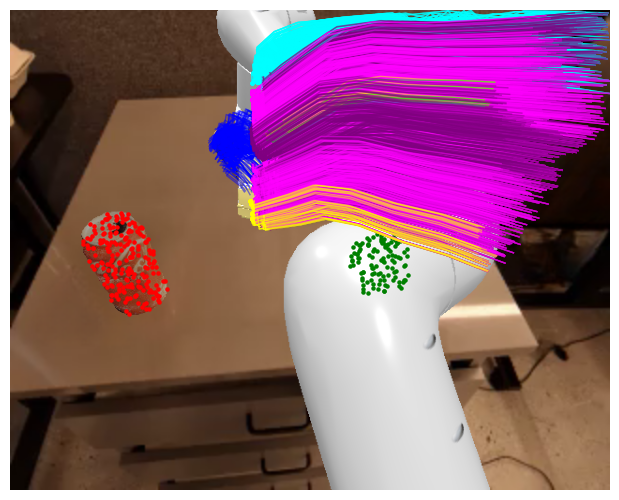

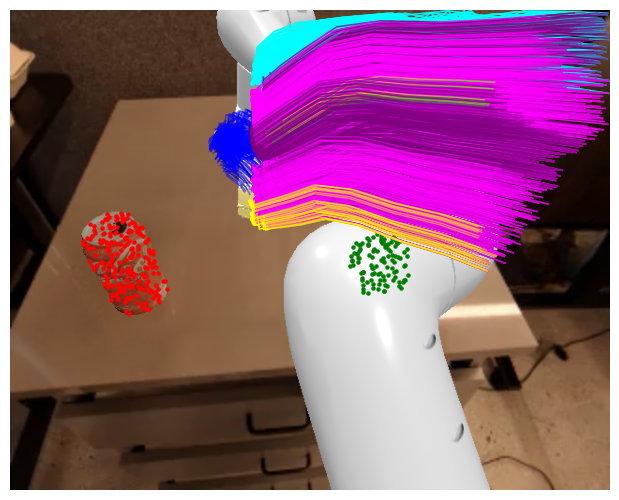

In [58]:
from collections import defaultdict
import imageio.v2 as imageio
frames = []

def get_height_colormap(points_3d, axis=2, cmap_name='hsv'):
    # 提取指定軸（默認 Z 軸）高度
    z = points_3d[:, axis]
    z_norm = (z - z.min()) / (z.max() - z.min() + 1e-8)  # normalize 到 [0,1]
    
    cmap = plt.get_cmap(cmap_name)
    colors = cmap(z_norm)[:, :3]  # 去除 alpha channel（只取 RGB）
    return colors  

camera_name = "overhead_camera"

actor_colors = ['red', 'blue', 'green', 'orange']
link_colors = ['cyan', 'purple', 'magenta', 'yellow', 'lime']
# 儲存每個 actor 的每個點在每一 frame 中的投影位置
# actor_trace[actor_name][point_index] = list of (x, y)
actor_traces = defaultdict(lambda: defaultdict(list))
link_traces = defaultdict(lambda: defaultdict(list)) 

num_frames = len(images)
for i in range(20):
    img = images[i+4]
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(img)

    # 移除標題、邊框、刻度、軸線
    ax.axis('off')  # 關閉座標軸
    ax.set_title("")  # 不要標題
    for spine in ax.spines.values():
        spine.set_visible(False)  # 移除邊框線


    for j, (actor_name, points_local) in enumerate(actors_points.items()):
        pose0 = actor_trajectories[actor_name][4]
        pose = actor_trajectories[actor_name][i+4]
        
        # Get local points
        points_local = np.array(points_local)
        points_world = world_to_local(points_local, pose0)
        points_local = local_to_world(points_world, pose)

        # 投影到 2D
        points_2d = world_to_screen(env, camera_name, points_local)
        H, W = img.shape[:2]
        x, y = points_2d[:, 0], points_2d[:, 1]
        mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
        x, y = x[mask], y[mask]

   

        # 畫目前 frame 的點
        ax.scatter(x, y, s=5, c=actor_colors[j % len(actor_colors)])
        # 畫每一點的軌跡線
        for k in range(len(x)):
            actor_traces[actor_name][k].append((x[k], y[k]))
            trace = actor_traces[actor_name][k]
            if len(trace) >= 2:
                t = np.array(trace)
                ax.plot(t[:, 0], t[:, 1], color=actor_colors[j % len(actor_colors)], linewidth=1, alpha=0.5)


        for j, (link, points_local) in enumerate(link_points.items()):
            pose = current_frame_link_positions[link][i+4]
            pose0 = current_frame_link_positions[link][4]
            p, q = extract_pose_np(pose)
            pose_vec = np.concatenate([p, q])
            p0, q0 = extract_pose_np(pose0)
            pose0_vec = np.concatenate([p0, q0])
            points_local = np.array(points_local)
            points_world = world_to_local(points_local, pose0_vec)
            points_local = local_to_world(points_world, pose_vec)

            proj = world_to_screen(env, "overhead_camera", points_local)
            x, y = proj[:, 0], proj[:, 1]
            mask = (x >= 0) & (x < W) & (y >= 0) & (y < H)
            x, y = x[mask], y[mask]
            
            ax.scatter(x, y, s=5, c=link_colors[j % len(link_colors)], label=f"[Link] {link.get_name()}")

            for k in range(len(x)):
                link_traces[link][k].append((x[k], y[k]))
                trace = link_traces[link][k]
                if len(trace) >= 2:
                    t = np.array(trace)
                    ax.plot(t[:, 0], t[:, 1], color=link_colors[j % len(link_colors)], linewidth=1, alpha=0.5)

    plt.tight_layout(pad=0)
    plt.show()
    fig.canvas.draw()
    frame = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    frame = frame.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    frames.append(frame)
    plt.close(fig)
imageio.mimsave("actor_link_trace0423_01.gif", frames, fps=5, loop=0)



In [1]:
first_obs = obs_records[0]
print(len(obs_records))


NameError: name 'obs_records' is not defined

In [102]:
import numpy as np
import imageio.v2 as imageio
import matplotlib.cm as cm
from PIL import Image, ImageDraw
import mediapy as media

def project_3d_to_2d(point, K, R_matrix, T):
    """
    Project 3D point to 2D image plane
    
    Args:
    - point: 3D point coordinates
    - K: Camera intrinsic matrix
    - R_matrix: Rotation matrix
    - T: Translation vector
    
    Returns:
    - 2D projected point
    """
    # Convert point to homogeneous coordinates
    point_3d_homogeneous = np.concatenate([point, [1]])
    
    # Apply extrinsic transformation (rotation and translation)
    world_to_camera = np.eye(4)
    world_to_camera[:3, :3] = R_matrix
    world_to_camera[:3, 3] = T
    
    # Transform point to camera coordinates
    point_camera = world_to_camera @ point_3d_homogeneous
    
    # Project to image plane
    point_2d_homogeneous = K @ point_camera[:3]
    
    # Perspective division
    if point_2d_homogeneous[2] != 0:
        point_2d = point_2d_homogeneous[:2] / point_2d_homogeneous[2]
        return point_2d
    
    return None

def create_trajectory_gif(pointclouds_trajectories, K, R_matrix, T, image_frames):
    """
    Create a GIF showing point cloud trajectories
    
    Args:
    - pointclouds_trajectories: Dictionary of point clouds at each timestep
    - K: Camera intrinsic matrix
    - R_matrix: Camera rotation matrix
    - T: Camera translation vector
    - image_frames: List of image frames
    """
    colored_frames = []
    point_colors = {}
    
    # Step 1: Initialize by collecting all vertices' initial positions
    print("Initializing vertex colors...")
    all_initial_vertices = []
    
    # Collect initial positions and their indices
    for i, point in enumerate(pointclouds_trajectories[0]):
        position = np.array(point[:3])
        projected_position = project_3d_to_2d(position, K, R_matrix, T)
        if projected_position is not None:
            all_initial_vertices.append((i, projected_position))
    
    # Step 2: Sort vertices by their initial X coordinate
    sorted_points = sorted(all_initial_vertices, key=lambda x: x[1][0], reverse=False)
    
    # Step 3: Assign colors using a rainbow gradient
    colormap = cm.get_cmap("gist_rainbow")
    total_points = len(sorted_points)
    
    for i, (point_idx, _) in enumerate(sorted_points):
        color_index = i / max(1, total_points - 1)
        rgb_color = colormap(color_index)
        rgb_int = (int(rgb_color[0]*255), int(rgb_color[1]*255), int(rgb_color[2]*255))
        point_colors[point_idx] = rgb_int
    
    # Process each frame
    for frame_idx, frame in enumerate(image_frames):
        print(f"Processing frame {frame_idx+1}/{len(image_frames)}")
        
        # Convert frame to PIL Image for drawing
        pil_image = Image.fromarray(frame)
        draw = ImageDraw.Draw(pil_image)
        
        # Draw trajectories
        for timestep in range(1, len(pointclouds_trajectories)):
            for point_idx in range(len(pointclouds_trajectories[timestep])):
                # Extract 3D coordinates from current and previous timesteps
                last_point = pointclouds_trajectories[timestep-1][point_idx][:3]
                current_point = pointclouds_trajectories[timestep][point_idx][:3]
                
                # Calculate Euclidean distance between points
                point_distance = np.linalg.norm(current_point - last_point)
                
                # Set a small threshold for movement (e.g., 0.01 units)
                movement_threshold = 1e-10
                
                # Check if point has moved significantly
                if not np.allclose(last_point, current_point, atol=1e-10):
                    # Project last and current positions
                    last_projected_position = project_3d_to_2d(last_point, K, R_matrix, T)
                    current_projected_position = project_3d_to_2d(current_point, K, R_matrix, T)
                    
                    # Draw line if projections are valid
                    if (last_projected_position is not None and 
                        current_projected_position is not None):
                        print("haha")
                        draw.line([
                            int(last_projected_position[0]), int(last_projected_position[1]),
                            int(current_projected_position[0]), int(current_projected_position[1])
                        ], fill=point_colors.get(point_idx, (255,255,255)), width=1)
        
        # Convert back to numpy array and append
        colored_frames.append(np.array(pil_image))
    
    # Save and display the GIF
    output_path = "rainbow_vertex_trajectories.gif"
    imageio.mimsave(output_path, colored_frames, fps=5)
    print(f"GIF saved: {output_path}")
    media.show_video(colored_frames, fps=5)
    
    return colored_frames

# Usage example (you would replace these with your actual data)
create_trajectory_gif(
    pointclouds_trajectoriy,  # Your point cloud trajectories
    overhead_camera_intrinsic,  # Camera intrinsic matrix K
    overhead_camera_extrinsic[:3, :3],  # Rotation matrix R
    overhead_camera_extrinsic[:3, 3],  # Translation vector T
    image_frames  # Your list of image frames
)

Initializing vertex colors...


/tmp/ipykernel_670449/460115989.py:70: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("gist_rainbow")


Processing frame 1/10
Processing frame 2/10
Processing frame 3/10
Processing frame 4/10
Processing frame 5/10
Processing frame 6/10
Processing frame 7/10
Processing frame 8/10
Processing frame 9/10
Processing frame 10/10
GIF saved: rainbow_vertex_trajectories.gif


[array([[[  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0],
         ...,
         [ 13,   6,   3],
         [ 14,   7,   3],
         [ 14,   7,   3]],
 
        [[  0,   0,   0],
         [ 61,  41,  28],
         [ 62,  42,  29],
         ...,
         [ 13,   6,   3],
         [ 15,   8,   4],
         [ 16,   9,   5]],
 
        [[  0,   0,   0],
         [ 60,  40,  27],
         [ 61,  41,  28],
         ...,
         [ 13,   6,   3],
         [ 17,  10,   6],
         [ 22,  15,  11]],
 
        ...,
 
        [[ 12,   6,   2],
         [ 12,   6,   2],
         [ 12,   6,   2],
         ...,
         [159, 120,  88],
         [159, 120,  88],
         [157, 118,  86]],
 
        [[ 12,   6,   2],
         [ 12,   6,   2],
         [ 12,   6,   2],
         ...,
         [159, 120,  88],
         [159, 120,  88],
         [157, 118,  86]],
 
        [[ 12,   6,   2],
         [ 12,   6,   2],
         [ 12,   6,   2],
         ...,
         [  0,   0,   0],
  

# from pointcloud

In [ ]:
import numpy as np
import imageio.v2 as imageio
import mediapy as media

# 定義 max_dof（假設最大自由度為 16，根據實際情況可調整）
max_dof = 16

# 初始化
articulation_trajectories = {}
articulation_pose_trajectories = {}

while not (predicted_terminated or truncated):  # and timestep < max_timesteps:
    # 執行模型推論
    raw_action, action = model.step(get_image_from_maniskill2_obs_dict(env, obs).astype(np.uint8))
    predicted_terminated = bool(action["terminate_episode"][0] > 0)
    image = obs['image']['overhead_camera']['Color'].astype(np.uint8)
    image_frames.append(image)
    
    # 執行環境一步
    obs, reward, success, truncated, info = env.step(
        np.concatenate([action["world_vector"], action["rot_axangle"], action["gripper"]])
    )
    
    # 遍歷所有 actors
    for actor in actors:
        # 假設您只想記錄特定名稱的 actor，這裡可以修改條件來處理不同名稱的 actor
        if actor.get_name() == 'arena':
            continue
        
        actor_state = get_actor_state(actor)
        position = actor_state[:7]  # 獲取 3D 座標（x, y, z）
        # 如果 actor 不在字典中，則初始化
        if actor.get_name() not in actor_trajectories:
            actor_trajectories[actor.get_name()] = []  
        
        # 記錄該 actor 的位置
        actor_trajectories[actor.get_name()].append(position)
    
    # 遍歷所有 articulation 並使用 get_articulation_padded_state 填充狀態
    for articulation in articulations:
    # 使用 get_articulation_padded_state 而不是 get_articulation_state
        padded_state = get_articulation_padded_state(articulation, max_dof)
        
        # Initialize if needed
        if articulation not in articulation_trajectories:
            articulation_trajectories[articulation] = []
            articulation_pose_trajectories[articulation] = []
        
        # Add padded state to trajectories
        articulation_trajectories[articulation].append(padded_state)
        
        # Initialize a list to store all link positions for this frame
        current_frame_link_positions = []
        
        # 遍歷 articulation 的每個 link 並儲存其位置
        for link in articulation.get_links():
            link_pose = link.get_pose()
            #link_position = link_pose.p  # 獲取每個 link 的位置
            current_frame_link_positions.append(link_pose)
        
        # Store all link positions for this frame
        articulation_pose_trajectories[articulation].append(current_frame_link_positions)
            
    image = get_image_from_maniskill2_obs_dict(env, obs)
    #image_frames.append(image)
    images.append(image)
    timestep += 1

# 儲存為 GIF
images_rgb = [img[:, :, :3] if img.shape[2] == 4 else img for img in images]
gif_path = f"{task_name}_mesh_trajectories.gif"
#imageio.mimsave(gif_path, images, fps=20)
media.show_video(images_rgb, fps=10)
print(f"GIF 已儲存：{gif_path}")

TypeError: Cannot handle this data type: (1, 1, 3), <f4

In [27]:
media.show_video(images_rgb, fps=10)
print(f"GIF 已儲存：{gif_path}")

GIF 已儲存：google_robot_move_near_mesh_trajectories.gif


### 這裡在畫機械手

In [70]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import matplotlib.cm as cm
import mediapy as media

# 相機內參與外參 
K = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
extrinsic = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])
R = extrinsic[:3, :3]
T = extrinsic[:3, 3]
R_T = np.hstack((R, T.reshape(-1, 1)))

def project_3d_to_2d(position_3d, K, R_T):
    X, Y, Z = position_3d
    camera_point = np.dot(R_T, np.array([X, Y, Z, 1.0]))
    X_c, Y_c, Z_c = camera_point[:3]
    if Z_c != 0:
        u = (K[0, 0] * X_c) / Z_c + K[0, 2]
        v = (K[1, 1] * Y_c) / Z_c + K[1, 2]
        return int(u), int(v)
    else:
        return int(K[0, 2]), int(K[1, 2])

def boost_color(rgb_tuple, factor=1.8):
    """加強色彩飽和度與亮度，回傳 OpenCV 可用格式 (B, G, R)"""
    arr = np.array(rgb_tuple[:3]) * 255  # 轉成 0~255
    arr = np.clip(arr * factor, 0, 255)
    return tuple(arr.astype(int).tolist())

# 收集所有軌跡名稱
all_trajectories = []

# 收集 articulation root 軌跡
for articulation in articulation_trajectories.keys():
    trajectory_key = ("articulation_root", articulation, -1)
    all_trajectories.append(trajectory_key)

# 收集所有 articulation link 軌跡
for articulation_idx, articulation in enumerate(articulation_pose_trajectories.keys()):
    # 確定這個 articulation 有多少個 links
    max_links = 0
    for frame_poses in articulation_pose_trajectories[articulation]:
        if isinstance(frame_poses, np.ndarray) and frame_poses.size == 3:
            # 單個位置視為 link 0
            max_links = max(max_links, 1)
        elif hasattr(frame_poses, '__iter__'):
            max_links = max(max_links, len(frame_poses))
    
    # 為每個 link 添加軌跡
    for link_idx in range(max_links):
        trajectory_key = ("articulation_link", articulation, link_idx)
        all_trajectories.append(trajectory_key)

# 使用 gist_rainbow 顏色映射器為每個軌跡分配顏色
colormap = cm.get_cmap("gist_rainbow")
total_trajectories = len(all_trajectories)
print(f"Total trajectories: {total_trajectories}")

# 為每個軌跡分配顏色
trajectory_colors = {}
for i, trajectory_key in enumerate(all_trajectories):
    # 正規化索引到 0-1 範圍來使用顏色映射器
    color_index = i / max(1, total_trajectories - 1)
    # 從顏色映射器獲取顏色並轉換為 BGR
    rgb_color = colormap(color_index)
    bgr_color = boost_color(rgb_color)
    
    # 儲存顏色
    trajectory_colors[trajectory_key] = bgr_color

print(f"Assigned colors to {total_trajectories} trajectories")






# 製作 GIF
colored_frames = []
for frame_idx, frame in enumerate(image_frames):
    frame_bgr = cv2.cvtColor(frame.copy(), cv2.COLOR_RGB2BGR)
    
    # 為每個 articulation 的所有 links 畫軌跡
    # 首先收集每個 link 的位置歷史
    link_position_history = {}
    
    # 從 articulation_pose_trajectories 收集數據
    for articulation, pose_frames in articulation_pose_trajectories.items():
        art_idx = list(articulation_trajectories.keys()).index(articulation)
        
        # 確保我們不超出可用的幀數
        valid_frames = min(frame_idx + 1, len(pose_frames))
        
        if valid_frames < 2:
            continue
        
        # 為每個 link 建立一個位置歷史
        for f_idx in range(valid_frames):
            pose_data = pose_frames[f_idx]
            
            # 處理單個位置和位置列表兩種情況
            if pose_data is not None:
                if isinstance(pose_data, list):
                    # 如果是位置列表，為每個 link 建立記錄
                    for link_idx, link_pose in enumerate(pose_data):
                        # 從 pose 對象中提取位置
                        link_position = link_pose.p  # 使用 .p 屬性提取位置
                        
                        link_key = f"art{art_idx}_link{link_idx}"
                        if link_key not in link_position_history:
                            link_position_history[link_key] = []
                        link_position_history[link_key].append(link_position)
                elif hasattr(pose_data, 'p'):
                    # 如果是單個 pose 對象
                    link_key = f"art{art_idx}_link0"
                    if link_key not in link_position_history:
                        link_position_history[link_key] = []
                    link_position_history[link_key].append(pose_data.p)
    
    # 畫出所有 links 的軌跡
    for link_key, positions in link_position_history.items():
        if len(positions) < 2:
            continue
        
        # 從 link_key 解析出 articulation 和 link 索引
        art_idx = int(link_key.split('_')[0][3:])
        link_idx = int(link_key.split('_')[1][4:])
        
        # 取得此軌跡的顏色
        articulation = list(articulation_trajectories.keys())[art_idx]
        trajectory_key = ("articulation_link", articulation, link_idx)
        color = trajectory_colors.get(trajectory_key, (0, 255, 0))
        
        # 只繪製當前幀之前的軌跡
        current_positions = positions[:frame_idx + 1]
        
        # 投影 3D 點到 2D
        points_2d = [project_3d_to_2d(pos, K, R_T) for pos in current_positions]
        
        # 畫軌跡線 - 使用同一顏色畫整個軌跡
        for i in range(len(points_2d) - 1):
            cv2.line(frame_bgr, points_2d[i], points_2d[i + 1], color, 2, lineType=cv2.LINE_AA)
        
        # 畫終點與標籤
        if points_2d:
            cv2.circle(frame_bgr, points_2d[-1], 4, color, -1, lineType=cv2.LINE_AA)
            cv2.putText(frame_bgr, f"A{art_idx}L{link_idx}", points_2d[-1], 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1, cv2.LINE_AA)
    
    # 加入 frame
    colored_frames.append(cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB))

# 儲存 GIF
imageio.mimsave("articulation_links_unique_colors.gif", colored_frames, fps=20)
print("GIF 已儲存：articulation_links_unique_colors.gif")
media.show_video(colored_frames, fps=10)

/tmp/ipykernel_608171/2132685046.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("gist_rainbow")


Total trajectories: 38
Assigned colors to 38 trajectories
GIF 已儲存：articulation_links_unique_colors.gif


In [104]:
articulation_meshes = {}
for articulation in articulations:
    articulation_name = articulation.get_name()
        
        # Method 1: Get meshes directly for each link
    link_meshes = []
    links = articulation.get_links()
        
    for link in links:
        link_mesh = get_actor_meshes(link)
        link_meshes.append(link_mesh)
        
    articulation_meshes[articulation_name] = link_meshes
        
        # Alternatively, if get_articulation_meshes works correctly:
        # articulation_mesh = get_articulation_meshes(articulation)
        # articulation_meshes[articulation_name] = articulation_mesh
        
    print(f"Retrieved meshes for articulation {articulation_name}")

Retrieved meshes for articulation google_robot_meta_sim_fix_wheel_fix_fingertip


### 這裡在畫Actor

In [110]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import matplotlib.cm as cm

# 相機內參與外參
K = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
extrinsic = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])
R = extrinsic[:3, :3]
T = extrinsic[:3, 3]
R_T = np.hstack((R, T.reshape(-1, 1)))

def project_3d_to_2d(position_3d, K, R_T):
    X, Y, Z = position_3d
    camera_point = np.dot(R_T, np.array([X, Y, Z, 1.0]))
    X_c, Y_c, Z_c = camera_point[:3]
    if Z_c != 0:
        u = (K[0, 0] * X_c) / Z_c + K[0, 2]
        v = (K[1, 1] * Y_c) / Z_c + K[1, 2]
        return int(u), int(v)
    else:
        return int(K[0, 2]), int(K[1, 2])

# Step 1: 根據初始投影 v 座標排序決定顏色
actor_v_map = {}
for actor_name, trajectory in actor_trajectories.items():
    if len(trajectory) > 0:
        _, v = project_3d_to_2d(trajectory[0][:3], K, R_T)
        actor_v_map[actor_name] = v

sorted_names = sorted(actor_v_map.items(), key=lambda x: x[1])
v_values = np.array([v for _, v in sorted_names])
v_norm = (v_values - v_values.min()) / (v_values.ptp() + 1e-6)
colormap = cm.get_cmap("gist_rainbow")

def boost_color(rgb_tuple, factor=1.8):
    """加強色彩飽和度與亮度，回傳 OpenCV 可用格式 (B, G, R)"""
    arr = np.array(rgb_tuple[:3]) * 255  # 轉成 0~255
    arr = np.clip(arr * factor, 0, 255)
    return tuple(arr.astype(int).tolist())  # 修正重點在這行

actor_colors = {
    name: boost_color(colormap(norm_val)) for (name, _), norm_val in zip(sorted_names, v_norm)
}

# Step 2: 製作 GIF
colored_frames = []
for frame_idx, frame in enumerate(image_frames):
    frame_bgr = cv2.cvtColor(frame.copy(), cv2.COLOR_RGB2BGR)

    for actor_name, trajectory in actor_trajectories.items():
        if len(trajectory) < 2:
            continue

        color = actor_colors[actor_name]
        points_2d = [
            project_3d_to_2d(pos[:3], K, R_T)
            for pos in trajectory[:frame_idx + 1]
        ]

        # 畫軌跡線
        for i in range(len(points_2d) - 1):
            cv2.line(frame_bgr, points_2d[i], points_2d[i + 1], color, 3, lineType=cv2.LINE_AA)

        # 畫終點
        if points_2d:
            cv2.circle(frame_bgr, points_2d[-1], 6, color, -1, lineType=cv2.LINE_AA)

    # 加入 frame
    colored_frames.append(cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB))

# Step 3: 儲存 GIF
imageio.mimsave("actor_trajectories_vivid.gif", colored_frames, fps=20)
print("GIF 已儲存：actor_trajectories_vivid.gif")
media.show_video(colored_frames, fps=10)

ValueError: zero-size array to reduction operation minimum which has no identity

### 這個是成功的投影

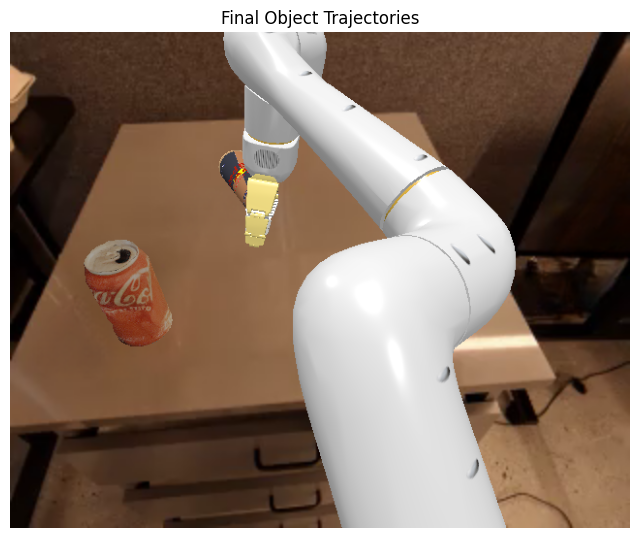

In [112]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random

# 假設已經從影像中取得的內參和外參
overhead_camera_intrinsic = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
overhead_extrinsic_matrix = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])

final_image = image.copy()  # 取得最後一幀
final_image_bgr = cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR)

def project_3d_to_2d(position_3d, K, R_T):
    """將3D世界座標轉換到2D圖像座標"""
    X, Y, Z = position_3d

    # 使用外參矩陣將世界座標轉換到相機座標系
    # 相機座標系中的點
    camera_point = np.dot(R_T, np.array([X, Y, Z, 1.0]))  # 增加齊次座標
    X_c, Y_c, Z_c = camera_point[:3]  # 相機座標系中的 (X_c, Y_c, Z_c)

    # 使用內參進行投影
    if Z_c != 0:
        u = (K[0, 0] * X_c) / Z_c + K[0, 2]  # 計算 u
        v = (K[1, 1] * Y_c) / Z_c + K[1, 2]  # 計算 v
        return u, v
    else:
        return K[0, 2], K[1, 2]  # 如果 Z_c 為 0，則返回相機中心的像素


# 對於每個物體，繪製其運動軌跡
for actor_name, trajectory in actor_trajectories.items():
    color = [int(random.random() * 255), int(random.random() * 255), int(random.random() * 255)]  # 隨機顏色 (BGR)
    x_vals, y_vals, z_vals, qx_vals, qy_vals, qz_vals, qw_vals = zip(*trajectory)

    # 使用旋轉矩陣 R 和平移向量 T 獲取外參矩陣
    R = overhead_extrinsic_matrix[:3, :3]
    T = overhead_extrinsic_matrix[:3, 3]
    R_T = np.hstack((R, T.reshape(-1, 1)))  # 合併為 3x4 外參矩陣 [R | T]

    # 將 3D 座標投影到 2D 屏幕上
    projected_points = [project_3d_to_2d((x, y, z), overhead_camera_intrinsic, R_T) for x, y, z, _, _, _, _ in trajectory]
    u_vals, v_vals = zip(*projected_points)

    # 在每個時間步上繪製軌跡
    for i in range(len(u_vals) - 1):
    # 在每兩個點之間畫線，將座標轉換為整數
        pt1 = (int(u_vals[i]), int(v_vals[i]))  # 轉換為整數
        pt2 = (int(u_vals[i + 1]), int(v_vals[i + 1]))  # 轉換為整數
        cv2.line(final_image_bgr, pt1, pt2, color, 2)

    # 在終點處畫出圓形標記
    end_x, end_y, end_z, _, _, _, _ = trajectory[-1]
    projected_end_point = project_3d_to_2d((end_x, end_y, end_z), overhead_camera_intrinsic, R_T)
    end_point_int = (int(projected_end_point[0]), int(projected_end_point[1]))
    cv2.circle(final_image_bgr, end_point_int, 8, color, -1)  # 終點標記

# 顯示最終影像
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(final_image_bgr, cv2.COLOR_BGR2RGB))
plt.title("Final Object Trajectories")
plt.axis("off")
plt.show()


In [113]:
actors_meshes = {}
for actor in actors:
    actor_meshes = get_actor_meshes(actor)
    
    if actor.get_name() not in actor_meshes:
        actors_meshes[actor.get_name()] = [] 
    
    actors_meshes[actor.get_name()] = actor_meshes

print(actors_meshes) 

{'arena': [<trimesh.Trimesh(vertices.shape=(21585, 3), faces.shape=(38097, 3))>], 'baked_opened_coke_can_v2': [<trimesh.Trimesh(vertices.shape=(74, 3), faces.shape=(144, 3))>], 'baked_opened_redbull_can_v2': [<trimesh.Trimesh(vertices.shape=(106, 3), faces.shape=(208, 3))>, <trimesh.Trimesh(vertices.shape=(5, 3), faces.shape=(6, 3))>, <trimesh.Trimesh(vertices.shape=(12, 3), faces.shape=(20, 3))>, <trimesh.Trimesh(vertices.shape=(4, 3), faces.shape=(4, 3))>, <trimesh.Trimesh(vertices.shape=(4, 3), faces.shape=(4, 3))>, <trimesh.Trimesh(vertices.shape=(4, 3), faces.shape=(4, 3))>, <trimesh.Trimesh(vertices.shape=(4, 3), faces.shape=(4, 3))>, <trimesh.Trimesh(vertices.shape=(17, 3), faces.shape=(30, 3))>], 'baked_apple_v2': [<trimesh.Trimesh(vertices.shape=(15, 3), faces.shape=(26, 3))>, <trimesh.Trimesh(vertices.shape=(32, 3), faces.shape=(60, 3))>, <trimesh.Trimesh(vertices.shape=(62, 3), faces.shape=(120, 3))>, <trimesh.Trimesh(vertices.shape=(79, 3), faces.shape=(154, 3))>, <trimesh.

In [115]:
import numpy as np
import mediapy as media
import cv2
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import matplotlib.cm as cm
from scipy.spatial.transform import Rotation as R

# Camera intrinsic and extrinsic parameters
K = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
extrinsic = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])
R_matrix = extrinsic[:3, :3]
T = extrinsic[:3, 3]
R_T = np.hstack((R_matrix, T.reshape(-1, 1)))

def project_3d_to_2d(position_3d, K, R_T):
    """Project 3D point to 2D image coordinates"""
    X, Y, Z = position_3d
    camera_point = np.dot(R_T, np.array([X, Y, Z, 1.0]))
    X_c, Y_c, Z_c = camera_point[:3]
    if Z_c != 0:
        u = (K[0, 0] * X_c) / Z_c + K[0, 2]
        v = (K[1, 1] * Y_c) / Z_c + K[1, 2]
        return int(u), int(v)
    else:
        return int(K[0, 2]), int(K[1, 2])

def apply_transform(vertices, position, quaternion):
    """對 mesh 頂點進行旋轉和位移變換"""
    quaternion_new = [quaternion[1], quaternion[2], quaternion[3], quaternion[0]]  # 轉為 [x, y, z, w]
    rotation = R.from_quat(quaternion_new).as_matrix()  # 四元數轉旋轉矩陣
    #quaternion = [q_wxyz[1], q_wxyz[2], q_wxyz[3], q_wxyz[0]]  # 轉為 [x, y, z, w]
    transformed_vertices = vertices @ rotation + position
    return transformed_vertices

def boost_color(rgb_tuple, factor=1.5):
    """Enhance color brightness and convert to BGR for OpenCV"""
    # Convert from RGB to BGR and enhance brightness
    bgr = np.array([rgb_tuple[2], rgb_tuple[1], rgb_tuple[0]]) * 255  # Convert to 0-255 BGR
    bgr = np.clip(bgr * factor, 0, 255)
    return tuple(bgr.astype(int).tolist())

def create_trajectory_gif(image_frames, actor_trajectories, actors_meshes):
    """Create GIF with actor and mesh vertex trajectories"""
    colored_frames = []
    actor_colors = {}
    vertex_colors = {}  # Dictionary to store colors for each vertex
    
    # Step 1: Initialize by collecting all vertices' initial positions
    print("Initializing vertex colors...")
    all_initial_vertices = []
    vertex_to_actor_mesh = {}  # Map vertices to their actor and mesh
    
    for actor_name, meshes in actors_meshes.items():
        if actor_name not in actor_trajectories or len(actor_trajectories[actor_name]) == 0:
            continue
            
        # Get initial position and orientation
        initial_pos = actor_trajectories[actor_name][0]
        position = np.array(initial_pos[:3])
        quaternion = initial_pos[3:7] if len(initial_pos) >= 7 else [0, 0, 0, 1]
        
        for mesh_idx, mesh in enumerate(meshes):
            # Get mesh vertices
            vertices = np.array(mesh.vertices)
            
            # Transform vertices to world space at initial position
            transformed_vertices = apply_transform(vertices, position, quaternion)
            
            # Store vertices with their actor/mesh info
            for vertex_idx, vertex in enumerate(transformed_vertices):
                vertex_key = (actor_name, mesh_idx, vertex_idx)
                all_initial_vertices.append((vertex_key, vertex))
    
    # Step 2: Sort all vertices by their initial Y coordinate (top to bottom)
    sorted_vertices = sorted(all_initial_vertices, key=lambda x: x[1][0], reverse=False)
    
    # Step 3: Assign colors using a rainbow gradient
    colormap = cm.get_cmap("gist_rainbow")
    total_vertices = len(sorted_vertices)
    
    for i, ((actor_name, mesh_idx, vertex_idx), _) in enumerate(sorted_vertices):
        # Normalize index to 0-1 range for colormap
        color_index = i / max(1, total_vertices - 1)
        # Get color from colormap and convert to BGR
        rgb_color = colormap(color_index)
        bgr_color = boost_color(rgb_color)
        
        # Store the color
        if actor_name not in vertex_colors:
            vertex_colors[actor_name] = {}
        if mesh_idx not in vertex_colors[actor_name]:
            vertex_colors[actor_name][mesh_idx] = {}
        vertex_colors[actor_name][mesh_idx][vertex_idx] = bgr_color
    
    print(f"Assigned colors to {total_vertices} vertices")
    
    # Process each frame
    for frame_idx, frame in enumerate(image_frames):
        print(f"Processing frame {frame_idx+1}/{len(image_frames)}")
        frame_bgr = cv2.cvtColor(frame.copy(), cv2.COLOR_RGB2BGR)
        
        # Process each actor
        for actor_name, trajectory in actor_trajectories.items():
            # Skip if no mesh data or trajectory data
            if actor_name not in actors_meshes or len(trajectory) < 2:
                continue
            
            # Get trajectory up to current frame
            current_trajectory = trajectory[:frame_idx + 1]
            
            # Generate actor color if not already assigned
            if actor_name not in actor_colors:
                actor_colors[actor_name] = (255, 255, 255)  # White for actor path
            
            # Draw actor center trajectory
            actor_points_2d = []
            for pos in current_trajectory:
                point_2d = project_3d_to_2d(pos[:3], K, R_T)
                actor_points_2d.append(point_2d)
            
            # Draw trajectory lines for actor center
            for i in range(len(actor_points_2d) - 1):
                cv2.line(frame_bgr, actor_points_2d[i], actor_points_2d[i + 1], 
                         actor_colors[actor_name], 3, lineType=cv2.LINE_AA)
            
            # Draw current position of actor center
            if actor_points_2d:
                cv2.circle(frame_bgr, actor_points_2d[-1], 6, actor_colors[actor_name], -1, lineType=cv2.LINE_AA)
            
            # Process each mesh for this actor
            for mesh_idx, mesh in enumerate(actors_meshes[actor_name]):
                # Get mesh vertices
                vertices = np.array(mesh.vertices)
                
                # Initialize storage for vertex trajectories
                if frame_idx == 0:
                    # For first frame, initialize the vertex trajectories
                    mesh.vertex_trajectories = [[] for _ in range(len(vertices))]
                
                # Get current position and orientation from trajectory
                if frame_idx < len(trajectory):
                    pos_data = trajectory[frame_idx]
                    position = np.array(pos_data[:3])
                    
                    # Check if quaternion data is available
                    if len(pos_data) >= 7:
                        quaternion = pos_data[3:7]
                        
                    else:
                        quaternion = [0, 0, 0, 1]  # Default quaternion (no rotation)
                    
                    # Transform all vertices based on actor's position and orientation
                    transformed_vertices = apply_transform(vertices, position, quaternion)
                    
                    # Store transformed vertices
                    for i, vertex in enumerate(transformed_vertices):
                        mesh.vertex_trajectories[i].append(vertex)
                
                # Draw vertex trajectories up to current frame
                for vertex_idx, vertex_path in enumerate(mesh.vertex_trajectories):
                    # Get the color for this vertex
                    if (actor_name in vertex_colors and 
                        mesh_idx in vertex_colors[actor_name] and 
                        vertex_idx in vertex_colors[actor_name][mesh_idx]):
                        vertex_color = vertex_colors[actor_name][mesh_idx][vertex_idx]
                    else:
                        # Default color if no specific color assigned
                        vertex_color = (200, 200, 200)
                    
                    # Project vertices to 2D
                    vertex_points_2d = []
                    for vertex_pos in vertex_path:
                        point_2d = project_3d_to_2d(vertex_pos, K, R_T)
                        vertex_points_2d.append(point_2d)
                    
                    # Draw vertex trajectory lines
                    for i in range(len(vertex_points_2d) - 1):
                        cv2.line(frame_bgr, vertex_points_2d[i], vertex_points_2d[i + 1], 
                                vertex_color, 1, lineType=cv2.LINE_AA)
                    
                    # Draw current position of vertex
                    if vertex_points_2d:
                        cv2.circle(frame_bgr, vertex_points_2d[-1], 1, vertex_color, -1)
        
        # Add frame to GIF
        colored_frames.append(cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB).astype(np.uint8))
        
    
    # Save GIF
    imageio.mimsave("rainbow_vertex_trajectories.gif", colored_frames, fps=20)
    print("GIF saved: rainbow_vertex_trajectories.gif")
    media.show_video(colored_frames, fps=10)
    

def create_mesh_trajectories_gif(image_frames, actor_trajectories, actors):
    """Main function to process mesh data and create trajectory GIF"""
    # Collect mesh data for all actors
    actors_meshes = {}
    
    for actor in actors:
        actor_name = actor.get_name()
        actor_meshes = get_actor_meshes(actor)  # Your existing function
        actors_meshes[actor_name] = actor_meshes
    
    # Create GIF with trajectories
    create_trajectory_gif(image_frames, actor_trajectories, actors_meshes)

# Call the main function to create the GIF
create_mesh_trajectories_gif(image_frames, actor_trajectories, actors)

Initializing vertex colors...
Assigned colors to 0 vertices
Processing frame 1/81
Processing frame 2/81
Processing frame 3/81
Processing frame 4/81
Processing frame 5/81
Processing frame 6/81
Processing frame 7/81
Processing frame 8/81
Processing frame 9/81
Processing frame 10/81
Processing frame 11/81
Processing frame 12/81
Processing frame 13/81
Processing frame 14/81
Processing frame 15/81
Processing frame 16/81
Processing frame 17/81
Processing frame 18/81
Processing frame 19/81
Processing frame 20/81
Processing frame 21/81
Processing frame 22/81
Processing frame 23/81
Processing frame 24/81
Processing frame 25/81
Processing frame 26/81
Processing frame 27/81
Processing frame 28/81
Processing frame 29/81
Processing frame 30/81
Processing frame 31/81
Processing frame 32/81
Processing frame 33/81
Processing frame 34/81
Processing frame 35/81
Processing frame 36/81
Processing frame 37/81
Processing frame 38/81
Processing frame 39/81
Processing frame 40/81
Processing frame 41/81
Proces

/tmp/ipykernel_88289/3362846315.py:79: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("gist_rainbow")


GIF saved: rainbow_vertex_trajectories.gif


In [16]:
import numpy as np
import mediapy as media
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import matplotlib.cm as cm
from scipy.spatial.transform import Rotation as R
from PIL import Image, ImageDraw

# Camera intrinsic and extrinsic parameters should be defined outside
# K = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
# extrinsic = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])
# R_matrix = extrinsic[:3, :3]
# T = extrinsic[:3, 3]

def project_3d_to_2d(position_3d, K, R_matrix, T):
    """
    Project 3D world coordinates to 2D camera coordinates using proper camera model
    
    Args:
        position_3d: 3D point in world coordinates [X, Y, Z]
        K: Camera intrinsic matrix (3x3)
        R_matrix: Rotation matrix component of extrinsic matrix (3x3)
        T: Translation vector component of extrinsic matrix (3x1)
        
    Returns:
        (u, v): 2D point in image coordinates or None if behind camera
    """
    # First transform point from world to camera coordinates
    position_3d = np.array(position_3d)
    # Apply R|T transformation: X_camera = R*X_world + T
    camera_point = np.dot(R_matrix, position_3d) + T
    
    # Get camera coordinates
    X_c, Y_c, Z_c = camera_point
    
    # Check if point is in front of camera
    if Z_c <= 0.001:  # Small epsilon to avoid precision issues
        return None  # Point is behind or too close to camera
    
    # Project to image plane using intrinsic matrix
    u = (K[0, 0] * X_c) / Z_c + K[0, 2]
    v = (K[1, 1] * Y_c) / Z_c + K[1, 2]
    
    return u, v

def normalize_quaternion(q):
    """Normalize a quaternion to ensure unit length"""
    norm = np.linalg.norm(q)
    if norm < 1e-10:
        return np.array([0, 0, 0, 1])  # Default identity quaternion
    return q / norm

def apply_transform(vertices, position, quaternion):
    """
    Apply transformation (translation + rotation) to vertices
    
    Args:
        vertices: Array of 3D vertices
        position: 3D position [X, Y, Z]
        quaternion: Rotation as quaternion [x, y, z, w]
        
    Returns:
        Array of transformed vertices
    """
    # Ensure quaternion is normalized
    #quaternion = normalize_quaternion(quaternion)
    quaternion = [quaternion[1], quaternion[2], quaternion[3], quaternion[0]]
    # Convert quaternion to rotation matrix
    rot = R.from_quat(quaternion)
    rot_matrix = rot.as_matrix()
    
    # Apply rotation and translation to each vertex
    transformed_vertices = []
    for vertex in vertices:
        # Apply rotation
        rotated_vertex = np.dot(rot_matrix, vertex)
        # Apply translation
        transformed_vertex = rotated_vertex + position
        transformed_vertices.append(transformed_vertex)
    
    return np.array(transformed_vertices)

def create_trajectory_gif(image_frames, actor_trajectories, actors_meshes, K, R_matrix, T):
    """
    Create GIF with actor and mesh vertex trajectories
    
    Args:
        image_frames: List of image frames
        actor_trajectories: Dictionary of actor trajectories
        actors_meshes: Dictionary of actor mesh data
        K: Camera intrinsic matrix
        R_matrix: Rotation matrix from extrinsic
        T: Translation vector from extrinsic
    """
    colored_frames = []
    actor_colors = {}
    vertex_colors = {}
    
    # Step 1: Initialize by collecting all vertices' initial positions
    print("Initializing vertex colors...")
    all_initial_vertices = []
    
    for actor_name, meshes in actors_meshes.items():
        if actor_name not in actor_trajectories or len(actor_trajectories[actor_name]) == 0:
            continue
            
        # Get initial position and orientation
        initial_pos = actor_trajectories[actor_name][0]
        position = np.array(initial_pos[:3])
        quaternion = initial_pos[3:7] if len(initial_pos) >= 7 else [0, 0, 0, 1]
        
        for mesh_idx, mesh in enumerate(meshes):
            # Get mesh vertices
            vertices = np.array(mesh.vertices)
            
            # Transform vertices to world space at initial position
            transformed_vertices = apply_transform(vertices, position, quaternion)
            
            # Store vertices with their actor/mesh info
            for vertex_idx, vertex in enumerate(transformed_vertices):
                vertex_key = (actor_name, mesh_idx, vertex_idx)
                all_initial_vertices.append((vertex_key, vertex))
    
    # Step 2: Sort all vertices by their initial X coordinate
    sorted_vertices = sorted(all_initial_vertices, key=lambda x: x[1][0], reverse=False)
    
    # Step 3: Assign colors using a rainbow gradient
    colormap = cm.get_cmap("gist_rainbow")
    total_vertices = len(sorted_vertices)
    
    for i, ((actor_name, mesh_idx, vertex_idx), _) in enumerate(sorted_vertices):
        # Normalize index to 0-1 range for colormap
        color_index = i / max(1, total_vertices - 1)
        # Get color from colormap
        rgb_color = colormap(color_index)
        # Convert to RGB tuple suitable for PIL (0-255 integers)
        rgb_int = (int(rgb_color[0]*255), int(rgb_color[1]*255), int(rgb_color[2]*255))
        
        # Store the color
        if actor_name not in vertex_colors:
            vertex_colors[actor_name] = {}
        if mesh_idx not in vertex_colors[actor_name]:
            vertex_colors[actor_name][mesh_idx] = {}
        vertex_colors[actor_name][mesh_idx][vertex_idx] = rgb_int
    
    print(f"Assigned colors to {total_vertices} vertices")
    
    # Initialize vertex trajectories for all meshes
    for actor_name, meshes in actors_meshes.items():
        for mesh_idx, mesh in enumerate(meshes):
            # Initialize storage for vertex trajectories
            mesh.vertex_trajectories = [[] for _ in range(len(mesh.vertices))]
    
    # Pre-compute all vertex positions for all frames first
    print("Pre-computing all vertex trajectories...")
    for actor_name, trajectory in actor_trajectories.items():
        if actor_name not in actors_meshes:
            continue
            
        for frame_idx, pos_data in enumerate(trajectory):
            position = np.array(pos_data[:3])
            quaternion = pos_data[3:7] if len(pos_data) >= 7 else [0, 0, 0, 1]
            
            for mesh_idx, mesh in enumerate(actors_meshes[actor_name]):
                vertices = np.array(mesh.vertices)
                transformed_vertices = apply_transform(vertices, position, quaternion)
                
                for vertex_idx, vertex_pos in enumerate(transformed_vertices):
                    mesh.vertex_trajectories[vertex_idx].append(vertex_pos)
    
    # Process each frame
    for frame_idx, frame in enumerate(image_frames):
        print(f"Processing frame {frame_idx+1}/{len(image_frames)}")
        
        # Convert frame to PIL Image for drawing
        pil_image = Image.fromarray(frame)
        draw = ImageDraw.Draw(pil_image)
        
        # Process each actor
        for actor_name, trajectory in actor_trajectories.items():
            # Skip if no mesh data or trajectory data
            if actor_name not in actors_meshes or len(trajectory) <= frame_idx:
                continue
            
            # Get trajectory up to current frame
            current_trajectory = trajectory[:frame_idx + 1]
            
            # Generate actor color if not already assigned
            if actor_name not in actor_colors:
                actor_colors[actor_name] = (255, 255, 255)  # White for actor path
            
            # Draw actor center trajectory
            actor_points_2d = []
            for pos in current_trajectory:
                point_2d = project_3d_to_2d(pos[:3], K, R_matrix, T)
                if point_2d is not None:  # Check if projection is valid
                    actor_points_2d.append(point_2d)
            
            # Draw trajectory lines for actor center
            for i in range(len(actor_points_2d) - 1):
                draw.line([actor_points_2d[i][0], actor_points_2d[i][1], 
                          actor_points_2d[i+1][0], actor_points_2d[i+1][1]], 
                          fill=actor_colors[actor_name], width=3)
            
            # Draw current position of actor center
            if actor_points_2d:
                radius = 6
                x, y = actor_points_2d[-1]
                draw.ellipse((x-radius, y-radius, x+radius, y+radius), 
                             fill=actor_colors[actor_name])
            
            # Process each mesh for this actor
            for mesh_idx, mesh in enumerate(actors_meshes[actor_name]):
                # Draw vertex trajectories up to current frame
                for vertex_idx, vertex_path in enumerate(mesh.vertex_trajectories):
                    # Skip if not enough frames for this vertex
                    if frame_idx >= len(vertex_path):
                        continue
                        
                    # Get the color for this vertex
                    if (actor_name in vertex_colors and 
                        mesh_idx in vertex_colors[actor_name] and 
                        vertex_idx in vertex_colors[actor_name][mesh_idx]):
                        vertex_color = vertex_colors[actor_name][mesh_idx][vertex_idx]
                    else:
                        # Default color if no specific color assigned
                        vertex_color = (200, 200, 200)
                    
                    # Use only up to current frame
                    current_vertex_path = vertex_path[:frame_idx + 1]
                    
                    # Project vertices to 2D
                    vertex_points_2d = []
                    for vertex_pos in current_vertex_path:
                        point_2d = project_3d_to_2d(vertex_pos, K, R_matrix, T)
                        if point_2d is not None:  # Check if projection is valid
                            vertex_points_2d.append(point_2d)
                    
                    # Draw vertex trajectory lines
                    for i in range(len(vertex_points_2d) - 1):
                        draw.line([vertex_points_2d[i][0], vertex_points_2d[i][1], 
                                  vertex_points_2d[i+1][0], vertex_points_2d[i+1][1]], 
                                  fill=vertex_color, width=1)
                    
                    # Draw current position of vertex
                    if vertex_points_2d:
                        small_radius = 1
                        x, y = vertex_points_2d[-1]
                        draw.ellipse((x-small_radius, y-small_radius, x+small_radius, y+small_radius), 
                                     fill=vertex_color)
        
        # Convert back to numpy array and add to frames
        colored_frames.append(np.array(pil_image))
    
    # Save GIF
    imageio.mimsave("rainbow_vertex_trajectories.gif", colored_frames, fps=20)
    print("GIF saved: rainbow_vertex_trajectories.gif")
    media.show_video(colored_frames, fps=10)

def create_mesh_trajectories_gif(image_frames, actor_trajectories, actors):
    """Main function to process mesh data and create trajectory GIF"""
    # Collect mesh data for all actors
    actors_meshes = {}
    
    for actor in actors:
        actor_name = actor.get_name()
        actor_meshes = get_actor_meshes(actor)  # Your existing function
        actors_meshes[actor_name] = actor_meshes
    
    # Get camera parameters
    K = np.array(obs["camera_param"]["overhead_camera"]["intrinsic_cv"])
    extrinsic = np.array(obs["camera_param"]["overhead_camera"]["extrinsic_cv"])
    R_matrix = extrinsic[:3, :3]
    T = extrinsic[:3, 3]
    
    # Create GIF with trajectories
    create_trajectory_gif(image_frames, actor_trajectories, actors_meshes, K, R_matrix, T)

# Optional: Add this debug function to verify projections
def debug_projection(frame, actor_trajectories, actors_meshes, K, R_matrix, T):
    """Draw a single debug frame with actor and vertex positions for verification"""
    frame_idx = 0  # or any specific frame you want to check
    pil_image = Image.fromarray(frame)
    draw = ImageDraw.Draw(pil_image)
    
    for actor_name, trajectory in actor_trajectories.items():
        if actor_name not in actors_meshes or frame_idx >= len(trajectory):
            continue
        
        # Actor position
        pos = trajectory[frame_idx]
        actor_2d = project_3d_to_2d(pos[:3], K, R_matrix, T)
        if actor_2d:
            # Draw actor as red circle
            x, y = actor_2d
            draw.ellipse((x-10, y-10, x+10, y+10), fill=(255, 0, 0))
            draw.text((x+15, y), actor_name, fill=(255, 0, 0))
            
            # Get position and orientation
            position = np.array(pos[:3])
            quaternion = pos[3:7] if len(pos) >= 7 else [0, 0, 0, 1]
            
            # Draw some vertices
            for mesh_idx, mesh in enumerate(actors_meshes[actor_name]):
                vertices = np.array(mesh.vertices)
                transformed_vertices = apply_transform(vertices, position, quaternion)
                
                # Draw only a few vertices to avoid clutter
                for i, vertex in enumerate(transformed_vertices):
                    if i % 10 == 0:  # Only draw every 10th vertex
                        v_2d = project_3d_to_2d(vertex, K, R_matrix, T)
                        if v_2d:
                            # Draw vertex as blue dot
                            vx, vy = v_2d
                            draw.ellipse((vx-3, vy-3, vx+3, vy+3), fill=(0, 0, 255))
                            # Draw line connecting to actor center
                            draw.line([x, y, vx, vy], fill=(0, 255, 0), width=1)
    
    return np.array(pil_image)

create_mesh_trajectories_gif(image_frames, actor_trajectories, actors)
debug_frame = debug_projection(image_frames[0], actor_trajectories, actors_meshes, K, R_matrix, T)

Initializing vertex colors...
Assigned colors to 672 vertices
Pre-computing all vertex trajectories...
Processing frame 1/80
Processing frame 2/80
Processing frame 3/80
Processing frame 4/80
Processing frame 5/80
Processing frame 6/80
Processing frame 7/80


/tmp/ipykernel_608171/617345706.py:128: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("gist_rainbow")


Processing frame 8/80
Processing frame 9/80
Processing frame 10/80
Processing frame 11/80
Processing frame 12/80
Processing frame 13/80
Processing frame 14/80
Processing frame 15/80
Processing frame 16/80
Processing frame 17/80
Processing frame 18/80
Processing frame 19/80
Processing frame 20/80
Processing frame 21/80
Processing frame 22/80
Processing frame 23/80
Processing frame 24/80
Processing frame 25/80
Processing frame 26/80
Processing frame 27/80
Processing frame 28/80
Processing frame 29/80
Processing frame 30/80
Processing frame 31/80
Processing frame 32/80
Processing frame 33/80
Processing frame 34/80
Processing frame 35/80
Processing frame 36/80
Processing frame 37/80
Processing frame 38/80
Processing frame 39/80
Processing frame 40/80
Processing frame 41/80
Processing frame 42/80
Processing frame 43/80
Processing frame 44/80
Processing frame 45/80
Processing frame 46/80
Processing frame 47/80
Processing frame 48/80
Processing frame 49/80
Processing frame 50/80
Processing fr

# Get Point Trajectories

In [50]:
import json
import numpy as np

def save_scene_data(image_frames, obs_records, scene_id, output_file):
    # 準備場景數據
    scene_data = {
        "scene_id": scene_id,
        "num_frames": len(image_frames),
        "num_points": len(obs_records[0]["pointcloud"]["xyzw"]),
        "frames": []
    }
    
    # 處理每一幀的點雲數據
    for frame_idx in range(len(image_frames)):
        frame_data = {
            "frame_id": frame_idx + 1,  # 幀ID（從1開始）
            "trajectory": []
        }
        
        curr_record = obs_records[frame_idx]
        curr_xyzw = curr_record["pointcloud"]["xyzw"]
        curr_rgb = curr_record["pointcloud"]["rgb"]
        
        for point_idx in range(len(curr_xyzw)):
            # 3D位置
            curr_position = curr_xyzw[point_idx][:3]
            
            # RGB顏色
            rgb = curr_rgb[point_idx]
            
            # 添加該點的數據到該幀的軌跡中
            frame_data["trajectory"].append({
                "point_idx": point_idx,
                "3d_position": curr_position.tolist(),
                "rgb": rgb.tolist()
            })
        
        # 將這一幀的數據添加到場景數據中
        scene_data["frames"].append(frame_data)
    
    # 將場景數據存儲為JSON檔案
    with open(output_file, 'w') as f:
        json.dump(scene_data, f, indent=4)
    
    print(f"Scene data saved to {output_file}")

# 使用範例
save_scene_data(image_frames, obs_records, "scene_1", "scene_1_data.json")


odict_keys(['base_camera', 'overhead_camera'])
odict_keys(['base_camera', 'overhead_camera'])


In [53]:
# 檢查每個相機的欄位
for cam_uid in obs["image"]:
    print(f"Keys for camera {cam_uid}: {obs['image'][cam_uid].keys()}")


Keys for camera base_camera: odict_keys(['rgb', 'depth', 'Segmentation'])
Keys for camera overhead_camera: odict_keys(['rgb', 'depth', 'Segmentation'])


### 投影

## Gallery

In [ ]:
# @markdown RT-1-X close drawer
print(task_name, model_name)
mediapy.show_video(images, fps=10)
# Note: we turned off the denoiser as the colab kernel will crash if it's turned on
# To use the denoiser, please git clone our SIMPLER environments
# and perform evaluations locally.

google_robot_pick_coke_can rt_1_x


In [ ]:
# @markdown Octo-base widowx_put_eggplant_in_basket
print(task_name, model_name)
mediapy.show_video(images, fps=10)

widowx_put_eggplant_in_basket octo-base


In [32]:
# @title Install code and dependencies {form-width: "25%"}
!pip install git+https://github.com/google-deepmind/tapnet.git

  Cloning https://github.com/google-deepmind/tapnet.git to /tmp/pip-req-build-z7jzpd1z
  Running command git clone --filter=blob:none --quiet https://github.com/google-deepmind/tapnet.git /tmp/pip-req-build-z7jzpd1z
  Resolved https://github.com/google-deepmind/tapnet.git to commit ba7c3afccccd1346af0ad1ec2b7f9a692a06dd76
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Using cached optax-0.2.4-py3-none-any.whl.metadata (8.3 kB)
  Using cached ml_dtypes-0.5.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (21 kB)
  Using cached ipywidgets-8.1.5-py3-none-any.whl.metadata (2.3 kB)
  Using cached ml_collections-1.0.0-py3-none-any.whl.metadata (22 kB)
  Using cached widgetsnbextension-4.0.13-py3-none-any.whl.metadata (1.6 kB)
  Using cached jupyterlab_widgets-3.0.13-py3-none-any.whl.metadata (4.1 kB)
Using cached ipywidgets-8.1.5-py3-none-any

In [34]:
MODEL_TYPE = 'bootstapir'  # 'tapir' or 'bootstapir'

In [35]:
# @title Download Model {form-width: "25%"}

%mkdir /home/jerry-tseng/robinlab/delta/VisionProject/code/tapnet/checkpoints

if MODEL_TYPE == "tapir":
  !wget -P tapnet/checkpoints https://storage.googleapis.com/dm-tapnet/tapir_checkpoint_panning.npy
else:
  !wget -P tapnet/checkpoints https://storage.googleapis.com/dm-tapnet/bootstap/bootstapir_checkpoint_v2.npy

%ls tapnet/checkpoints

mkdir: 無法建立 「/home/jerry-tseng/robinlab/delta/VisionProject/code/tapnet/checkpoints」 目錄: 沒有此一檔案或目錄
--2025-04-02 14:48:13--  https://storage.googleapis.com/dm-tapnet/bootstap/bootstapir_checkpoint_v2.npy
正在查找主機 storage.googleapis.com (storage.googleapis.com)... 142.250.196.219, 142.250.66.91, 142.250.198.91, ...
正在連接 storage.googleapis.com (storage.googleapis.com)|142.250.196.219|:443... 連上了。
已送出 HTTP 要求，正在等候回應... 200 OK
長度: 218818353 (209M) [application/octet-stream]
儲存到：‘tapnet/checkpoints/bootstapir_checkpoint_v2.npy’

bootstapir_checkpoi 100%[===================>] 208.68M  9.37MB/s    於 22s      

2025-04-02 14:48:35 (9.46 MB/s) - 已儲存 ‘tapnet/checkpoints/bootstapir_checkpoint_v2.npy’ [218818353/218818353]

bootstapir_checkpoint_v2.npy


In [2]:
# @title Imports {form-width: "25%"}

import haiku as hk
import jax
import jax.numpy as jnp
import mediapy as media
import numpy as np
import tree

AttributeError: module 'numpy' has no attribute 'dtypes'

In [ ]:
tracks_XYZ = []
for i in range(len(obs_records)):
    position = obs_records[i]['image']['overhead_camera']['Position']
    
    # 重新塑形為 (num_points, 3) 的數組，並去除 alpha 通道
    reshaped_position = position.reshape(-1, 4)[..., :3]  # (num_points, 3)
    
    # 將此位置數據添加到 tracks_XYZ 中
    tracks_XYZ.append(reshaped_position)

# 將所有數據合併成一個 NumPy 數組 (num_frames, num_points, 3)
tracks_XYZ = np.array(tracks_XYZ)

# 打印結果
print(tracks_XYZ.shape)



(20, 327680, 3)


In [67]:
fx_fy_cx_cy = np.array([425, 425, 320, 256])
extrinsics_w2c = np.array([
    [ 9.2726380e-02,  9.9569201e-01, -2.2351742e-08, -2.4154928e-01],
    [ 7.0387590e-01, -6.5550283e-02, -7.0729196e-01,  7.8472352e-01],
    [-7.0424509e-01,  6.5584615e-02, -7.0692158e-01,  1.0430859e+00],
    [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  1.0000000e+00]
])


In [ ]:
from PIL import Image
import io
import numpy as np
frames = np.array(images)
print(frames.shape)
images_jpeg_bytes = []

# 遍歷每一幀圖像
for frame in frames:
    # 使用 PIL.Image 來處理圖像
    pil_image = Image.fromarray(frame.astype(np.uint8))
    
    # 使用 io.BytesIO() 來創建一個字節流對象
    byte_io = io.BytesIO()
    
    # 將圖像保存為 JPEG 格式並存儲到字節流
    pil_image.save(byte_io, format="JPEG")
    
    # 獲取字節數據並將其添加到 images_jpeg_bytes 中
    byte_data = byte_io.getvalue()
    images_jpeg_bytes.append(byte_data)

# 將 images_jpeg_bytes 轉換為 NumPy 數組（如果需要）
images_jpeg_bytes = np.array(images_jpeg_bytes)

# 打印結果
print(f"images_jpeg_bytes shape: {images_jpeg_bytes.shape}")



(20, 512, 640, 3)
images_jpeg_bytes shape: (20,)


In [69]:
np.savez("test.npz", 
         images_jpeg_bytes=images, 
         tracks_XYZ=tracks_XYZ, 
         fx_fy_cx_cy=fx_fy_cx_cy, 
         extrinsics_w2c=extrinsics_w2c)

print("Data has been saved to 'output_data.npz'.")

Data has been saved to 'output_data.npz'.
